<a href="https://colab.research.google.com/github/lapatradaa/shap/blob/main/Copy_of_SHAP_multi_Gender(ITC).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SHAP

## Import data set (เรียกใช้ CSV)

In [3]:
import pandas as pd
import shutil

In [4]:
#เชื่อม google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## เลือกข้อมูล ทำ Background data ของ data train

In [5]:
dt_train = pd.read_csv (r'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Table_train_Predict.csv')
dt_train

,Unnamed: 0,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Fold,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V1.jpg,2,0,Female,7.107492,7.0,0.000003,Female,0.0
1,1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV1.jpg,4,0,Female,7.020138,7.0,0.000025,Female,0.0
2,2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V2.jpg,10,0,Female,6.975561,7.0,0.000808,Female,0.0
3,3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV2.jpg,9,0,Female,6.938187,7.0,0.000107,Female,0.0
4,4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V3.jpg,10,0,Female,6.916692,7.0,0.000014,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4184,4184,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J375.jpg,3,1,Male,25.299234,25.0,0.999988,Male,1.0
4185,4185,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J437.jpg,5,1,Male,24.729193,25.0,0.999987,Male,1.0
4186,4186,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J480.jpg,5,1,Male,24.564425,25.0,1.000000,Male,1.0
4187,4187,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J491.jpg,6,1,Male,24.113144,24.0,1.000000,Male,1.0


In [6]:
df = dt_train.drop(dt_train.columns[0], axis=1)
df

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Fold,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V1.jpg,2,0,Female,7.107492,7.0,0.000003,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV1.jpg,4,0,Female,7.020138,7.0,0.000025,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V2.jpg,10,0,Female,6.975561,7.0,0.000808,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV2.jpg,9,0,Female,6.938187,7.0,0.000107,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V3.jpg,10,0,Female,6.916692,7.0,0.000014,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4184,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J375.jpg,3,1,Male,25.299234,25.0,0.999988,Male,1.0
4185,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J437.jpg,5,1,Male,24.729193,25.0,0.999987,Male,1.0
4186,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J480.jpg,5,1,Male,24.564425,25.0,1.000000,Male,1.0
4187,25,M,Normal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J491.jpg,6,1,Male,24.113144,24.0,1.000000,Male,1.0


In [7]:
# นับรูป
# Get unique age values
unique_ages = dt_train['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = dt_train[(dt_train['Age(year)'] == age) & (dt_train['Gender'] == 'M')].shape
    print(f"Age {age}: {shape}")

# Get unique age values
unique_ages = dt_train['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'F' gender
for age in unique_ages:
    shape = dt_train[(dt_train['Age(year)'] == age) & (dt_train['Gender'] == 'F')].shape
    print(f"Age {age}: {shape}")

Age 7: (111, 15)
Age 8: (116, 15)
Age 9: (122, 15)
Age 10: (114, 15)
Age 11: (114, 15)
Age 12: (119, 15)
Age 13: (106, 15)
Age 14: (110, 15)
Age 15: (110, 15)
Age 16: (112, 15)
Age 17: (107, 15)
Age 18: (104, 15)
Age 19: (107, 15)
Age 20: (105, 15)
Age 21: (107, 15)
Age 22: (97, 15)
Age 23: (108, 15)
Age 24: (104, 15)
Age 25: (96, 15)
Age 7: (114, 15)
Age 8: (116, 15)
Age 9: (120, 15)
Age 10: (116, 15)
Age 11: (117, 15)
Age 12: (117, 15)
Age 13: (108, 15)
Age 14: (113, 15)
Age 15: (117, 15)
Age 16: (118, 15)
Age 17: (112, 15)
Age 18: (128, 15)
Age 19: (115, 15)
Age 20: (99, 15)
Age 21: (100, 15)
Age 22: (105, 15)
Age 23: (101, 15)
Age 24: (91, 15)
Age 25: (113, 15)


In [8]:
# เลือกรูปจาก train มาทำ bg data
import pandas as pd
import random

# Sample DataFrame (replace this with your actual DataFrame)
data = {
    'Age(year)': dt_train['Age(year)'],
    'Gender': dt_train['Gender'],
    'Folder_type': dt_train['Folder_type'],
    'Folder_name': dt_train['Folder_name'],
    'Path_Name': dt_train['Path_Name'],
    'Filename': dt_train['Filename'],
}

df = pd.DataFrame(data)

# Calculate the desired number of rows per unique age
desired_per_age = 2660 // (25 - 7 + 1)

# Initialize a list to store selected rows
selected_rows = []

# Iterate through unique age values
for age in range(7, 26):
    # Get all rows with the current age
    age_rows = df[df['Age(year)'] == age]

    # Randomly shuffle the rows for this age
    age_rows = age_rows.sample(frac=1, random_state=42)

    # Determine the number of rows to select for each gender
    rows_per_gender = desired_per_age // 2

    # Select rows for both "Male" and "Female" genders
    selected_male_rows = age_rows[age_rows['Gender'] == 'M'].head(rows_per_gender)
    selected_female_rows = age_rows[age_rows['Gender'] == 'F'].head(rows_per_gender)

    # Append the selected rows to the list
    selected_rows.extend([selected_male_rows, selected_female_rows])

# Concatenate the selected rows for each age into a final DataFrame
selected_dft = pd.concat(selected_rows)

# Now, selected_df contains 950 rows with an approximately even distribution of ages from 7 to 25
# and an equal number of "Male" and "Female" samples for each age.


In [9]:
selected_dft

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename
184,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV116.jpg
120,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV13.jpg
207,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV244.jpg
148,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV50.jpg
214,7,M,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV28.jpg
...,...,...,...,...,...,...
4050,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J245.jpg
4044,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J218.jpg
4024,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J148.jpg
4020,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J144.jpg


In [10]:
#selected_dft.to_csv('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Bg_train.csv')  # Setting index=False to avoid saving the row numbers as a column

In [11]:
# Get unique age values
unique_ages = selected_dft['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = selected_dft[(selected_dft['Age(year)'] == age) & (selected_dft['Gender'] == 'M')].shape
    print(f"Age {age}: {shape}")

# Get unique age values
unique_ages = selected_dft['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'F' gender
for age in unique_ages:
    shape = selected_dft[(selected_dft['Age(year)'] == age) & (selected_dft['Gender'] == 'F')].shape
    print(f"Age {age}: {shape}")

Age 7: (70, 6)
Age 8: (70, 6)
Age 9: (70, 6)
Age 10: (70, 6)
Age 11: (70, 6)
Age 12: (70, 6)
Age 13: (70, 6)
Age 14: (70, 6)
Age 15: (70, 6)
Age 16: (70, 6)
Age 17: (70, 6)
Age 18: (70, 6)
Age 19: (70, 6)
Age 20: (70, 6)
Age 21: (70, 6)
Age 22: (70, 6)
Age 23: (70, 6)
Age 24: (70, 6)
Age 25: (70, 6)
Age 7: (70, 6)
Age 8: (70, 6)
Age 9: (70, 6)
Age 10: (70, 6)
Age 11: (70, 6)
Age 12: (70, 6)
Age 13: (70, 6)
Age 14: (70, 6)
Age 15: (70, 6)
Age 16: (70, 6)
Age 17: (70, 6)
Age 18: (70, 6)
Age 19: (70, 6)
Age 20: (70, 6)
Age 21: (70, 6)
Age 22: (70, 6)
Age 23: (70, 6)
Age 24: (70, 6)
Age 25: (70, 6)


## เลือกข้อมูล ทำ Background data ของ data train

In [12]:
df_test_gender = pd.read_csv (r'/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/Table_test_Predict.csv')
df_test_gender = df_test_gender.iloc[:,1:]
print(df_test_gender.shape)
df_test_gender

(943, 13)


,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0
939,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J145.jpg,0,Female,21.118502,21.0,1.193671e-01,Female,0.0
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0


In [13]:
# เลือกเฉพาะ row ที่ทายถูก
c = df_test_gender[((df_test_gender['Gender_predict_str'] == 'Female') & (df_test_gender['Gender'] == 'F')) | ((df_test_gender['Gender_predict_str'] == 'Male') & (df_test_gender['Gender'] == 'M'))]
c

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0
939,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J145.jpg,0,Female,21.118502,21.0,1.193671e-01,Female,0.0
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0


In [14]:
# ทำค่า Prob
c['prob'] = c.apply(lambda row: 1 - row['Gender_predict'] if row['Gender'] == 'F' else row['Gender_predict'], axis=1)

<ipython-input-14-dfbf4747a020>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c['prob'] = c.apply(lambda row: 1 - row['Gender_predict'] if row['Gender'] == 'F' else row['Gender_predict'], axis=1)


In [15]:
c

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0,0.979090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0,0.999982
939,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J145.jpg,0,Female,21.118502,21.0,1.193671e-01,Female,0.0,0.880633
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0,0.998787
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0,1.000000


In [16]:
c['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25])

In [17]:
# Select rows where 'prob' is greater than 0.9
d = c[c['prob'] > 0.90]

# Display the selected rows
d

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0,0.979090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J86.jpg,0,Female,19.068132,19.0,9.307945e-06,Female,0.0,0.999991
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0,0.999982
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0,0.998787
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0,1.000000


In [18]:
# check ว่าในเเต่ละช่วงอายุมีกี่คน
# Get unique age values
unique_ages = d['Age(year)'].unique()

# Iterate through unique ages and calculate shape for 'M' gender
for age in unique_ages:
    shape = d[(d['Age(year)'] == age)].shape
    print(f"Age {age}: {shape}")

Age 7: (35, 14)
Age 8: (37, 14)
Age 9: (32, 14)
Age 10: (31, 14)
Age 11: (38, 14)
Age 12: (35, 14)
Age 13: (39, 14)
Age 14: (26, 14)
Age 15: (38, 14)
Age 16: (41, 14)
Age 17: (48, 14)
Age 18: (47, 14)
Age 19: (43, 14)
Age 20: (44, 14)
Age 21: (42, 14)
Age 22: (44, 14)
Age 23: (48, 14)
Age 24: (47, 14)
Age 25: (38, 14)


In [19]:
# Select the first 2048 rows
selected_test = d
selected_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0,0.979090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J86.jpg,0,Female,19.068132,19.0,9.307945e-06,Female,0.0,0.999991
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0,0.999982
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0,0.998787
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0,1.000000


## Create background

In [20]:
def process_input(dt_train):
    # Initialize an empty list to store background data
    background_data = []

    # Ensure 'Path_Name' column exists in the DataFrame
    if 'Path_Name' not in dt_train.columns:
        raise ValueError("The 'Path_Name' column does not exist in the DataFrame.")

    # Loop to preprocess and create the background data
    for i in range(len(dt_train)):
        print(f"Processing image {i+1}/{len(dt_train)}")
        # Get the image path from the DataFrame
        image_path = dt_train['Path_Name'].iloc[i]  # Use .iloc to access rows by integer index
        # Load and preprocess the image
        image = load_img(image_path, target_size=(224, 224))  # Adjust target_size
        preprocessed_image = img_to_array(image) / 255.0  # Normalize pixel values

        # Add the preprocessed image to the background_data list
        background_data.append(preprocessed_image)

    return background_data

### data train

In [21]:
import pandas as pd
import numpy as np
import torch
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [22]:
sdf_train = selected_dft.sort_values(by='Age(year)', kind='mergesort')
sdf_train

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename
184,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV116.jpg
120,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV13.jpg
207,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV244.jpg
148,7,M,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,VV50.jpg
214,7,M,Normal,Lt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipVV28.jpg
...,...,...,...,...,...,...
4050,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J245.jpg
4044,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J218.jpg
4024,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J148.jpg
4020,25,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,J144.jpg


In [23]:
sdf_train['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25])

In [24]:
background_train = process_input(sdf_train)

Processing image 1/2660
Processing image 2/2660
Processing image 3/2660
Processing image 4/2660
Processing image 5/2660
Processing image 6/2660
Processing image 7/2660
Processing image 8/2660
Processing image 9/2660
Processing image 10/2660
Processing image 11/2660
Processing image 12/2660
Processing image 13/2660
Processing image 14/2660
Processing image 15/2660
Processing image 16/2660
Processing image 17/2660
Processing image 18/2660
Processing image 19/2660
Processing image 20/2660
Processing image 21/2660
Processing image 22/2660
Processing image 23/2660
Processing image 24/2660
Processing image 25/2660
Processing image 26/2660
Processing image 27/2660
Processing image 28/2660
Processing image 29/2660
Processing image 30/2660
Processing image 31/2660
Processing image 32/2660
Processing image 33/2660
Processing image 34/2660
Processing image 35/2660
Processing image 36/2660
Processing image 37/2660
Processing image 38/2660
Processing image 39/2660
Processing image 40/2660
Processin

### data test

In [25]:
print(selected_test.shape)
selected_test.head()

(753, 14)


,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V69.jpg,0,Female,7.423399,7.0,0.005142,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV69.jpg,0,Female,7.415316,7.0,0.046188,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V70.jpg,0,Female,7.548301,8.0,0.006406,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,FlipV70.jpg,0,Female,7.492433,7.0,0.000020,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_to...,V74.jpg,0,Female,7.343049,7.0,0.020910,Female,0.0,0.979090


In [26]:
pd.set_option('display.max_colwidth', None)

In [27]:
sdf_test = selected_test.sort_values(by='Age(year)', kind='mergesort')
sdf_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,Filename,Gender_Class,Gender_Predict,Age_predict,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V69.jpg,V69.jpg,0,Female,7.423399,7.0,5.141945e-03,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV69.jpg,FlipV69.jpg,0,Female,7.415316,7.0,4.618836e-02,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V70.jpg,V70.jpg,0,Female,7.548301,8.0,6.406498e-03,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV70.jpg,FlipV70.jpg,0,Female,7.492433,7.0,2.021052e-05,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V74.jpg,V74.jpg,0,Female,7.343049,7.0,2.091009e-02,Female,0.0,0.979090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J86.jpg,J86.jpg,0,Female,19.068132,19.0,9.307945e-06,Female,0.0,0.999991
938,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J132.jpg,J132.jpg,0,Female,21.686228,22.0,1.800820e-05,Female,0.0,0.999982
940,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J149.jpg,J149.jpg,0,Female,19.639433,20.0,1.212668e-03,Female,0.0,0.998787
941,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J158.jpg,J158.jpg,0,Female,21.359797,21.0,3.044503e-09,Female,0.0,1.000000


In [28]:
sdf_test['Age(year)'].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25])

In [29]:
background_test = process_input(sdf_test)

Processing image 1/753
Processing image 2/753
Processing image 3/753
Processing image 4/753
Processing image 5/753
Processing image 6/753
Processing image 7/753
Processing image 8/753
Processing image 9/753
Processing image 10/753
Processing image 11/753
Processing image 12/753
Processing image 13/753
Processing image 14/753
Processing image 15/753
Processing image 16/753
Processing image 17/753
Processing image 18/753
Processing image 19/753
Processing image 20/753
Processing image 21/753
Processing image 22/753
Processing image 23/753
Processing image 24/753
Processing image 25/753
Processing image 26/753
Processing image 27/753
Processing image 28/753
Processing image 29/753
Processing image 30/753
Processing image 31/753
Processing image 32/753
Processing image 33/753
Processing image 34/753
Processing image 35/753
Processing image 36/753
Processing image 37/753
Processing image 38/753
Processing image 39/753
Processing image 40/753
Processing image 41/753
Processing image 42/753
P

In [30]:
print(type(background_test))

<class 'list'>


##**แปลง Bg dataเป็น array เพื่อใช้ในการคำนวณค่า SHAP**

In [31]:
background_train_array = np.array(background_train)
background_test_array = np.array(background_test)

In [32]:
print(len(background_train_array))
print(background_train_array.shape)
print(background_test_array.shape)

2660
(2660, 224, 224, 3)
(753, 224, 224, 3)


# คำนวณ SHAP Values

## load model

### Import

In [33]:
import os
import numpy as np
import pandas as pd
#import efficientnet.tfkeras
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0

### กำหนดค่าพารามิเตอร์ (ตามที่กำหนดใน Model)


In [34]:
batch_size = 16
width = 224
height = 224
epochs = 250 # รอบในการเทรน
dropout_rate = 0.2
input_shape = (height, width, 3)

### Clone Efficient

In [35]:
#ดึงข้อมูลใน Github มาใช้
import os
%cd /content
if not os.path.isdir("efficientnet_keras_transfer_learning"):
 !git clone https://github.com/Wanita-8943/efficientnet_keras_transfer_learning
%cd efficientnet_keras_transfer_learning/


/content
/content/efficientnet_keras_transfer_learning


### Load Model

In [36]:
import sys
sys.path.append('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/16_Multi_8e-6_250_Unfreeze.h5')

from efficientnet.layers import Swish, DropConnect
from efficientnet.model import ConvKernalInitializer
from tensorflow.keras.utils import get_custom_objects

get_custom_objects().update({
    'ConvKernalInitializer': ConvKernalInitializer,
    'Swish': Swish,
    'DropConnect':DropConnect
})


In [37]:
from tensorflow.keras.models import load_model
model = tf.keras.models.load_model("/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Model/Multi_task(Age)(7-25)/16_Multi_8e-6_250_Unfreeze.h5")
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 swish (Swish)               (None, 112, 112, 32)         0         ['batch_normalization[0][0

In [38]:
height = width = model.input_shape[1]
print(f"height: {height}, width: {width}")

height: 224, width: 224


In [39]:
# Check the number of output units in the final layer
num_output_units = model.layers[-1].output_shape[-1]

# Check if it's a binary classification model (2 output units) or not
if num_output_units == 2:
    print("This is a binary classification model.")
else:
    print("This is not a binary classification model.")

This is not a binary classification model.


## SHAP & YOLO

### SHAP

In [40]:
!pip install shap==0.44.1

In [41]:
import shap

In [42]:
print(background_test_array.shape)
print(background_test_array[[10]].shape) # ภาพที่ 10

(753, 224, 224, 3)
(1, 224, 224, 3)


In [43]:
model.output_names

['prediction_layer', 'prediction_layer2']

In [44]:
model.output_names[0] # age estimation

'prediction_layer'

In [45]:
model.output_names[1] # gender prediction

'prediction_layer2'

เลือกเฉพาะ Output layer ไปทำการหาความสำคัญ

In [46]:
import shap
import tensorflow as tf

# Create separate models for each output you want to explain
#AGE
model_layer1 = tf.keras.Model(inputs=model.input, outputs=model.get_layer('prediction_layer').output)
#Gender
model_layer2 = tf.keras.Model(inputs=model.input, outputs=model.get_layer('prediction_layer2').output)


In [47]:
# Define your explainer for the first output layer (prediction_layer)
#AGE
explainer_layer1 = shap.GradientExplainer(model_layer1, background_train_array)

In [48]:
# Define your explainer for the second output layer (prediction_layer2)
#Gender
explainer_layer2 = shap.GradientExplainer(model_layer2, background_train_array)

### yolo

In [49]:
# load YOLO ที่Train มา
# Replace with code to load your trained YOLO model
weights_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/papers/gpt/Yolo_v5/best.pt'

# Load YOLOv5 model from Google Drive
yolo_model = torch.hub.load('ultralytics/yolov5', 'custom', path=weights_path)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-7 Python-3.10.12 torch-2.2.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


#### ทํา non maximum suppression

In [121]:
import pandas as pd

def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def nms_per_class(df, iou_threshold=0.5):
    df_nms = pd.DataFrame()
    class_ids = df['class'].unique()

    for class_id in class_ids:
        df_class = df[df['class'] == class_id].copy()

        df_class_sorted = df_class.sort_values(by='confidence', ascending=False).reset_index(drop=True)
        retained_indices = []
        iou_values = []

        for i in range(len(df_class_sorted)):
            if i in retained_indices:
                continue

            retained_indices.append(i)
            iou_values.append(1.0)

            for j in range(i + 1, len(df_class_sorted)):
                if j in retained_indices:
                    continue

                boxA = df_class_sorted.iloc[i][['xmin', 'ymin', 'xmax', 'ymax']]
                boxB = df_class_sorted.iloc[j][['xmin', 'ymin', 'xmax', 'ymax']]
                iou_value = compute_iou(boxA, boxB)

                if iou_value > iou_threshold:
                    retained_indices.append(j)
                    iou_values.append(iou_value)

        df_nms_class = df_class_sorted.iloc[retained_indices].reset_index(drop=True)

        df_nms_class['iou'] = iou_values

        df_nms = pd.concat([df_nms, df_nms_class], ignore_index=True)

    return df_nms


#### def map box ที่ detectกับ SHAP value

##### pos img

In [106]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_pos(image_path, df, grayscale_image):
    selected_bboxes = []  #สร้าง list ว่าง มาเก็บกล่องที่มีค่า SHAP เกิน IoU ที่ 0.1
    value_than_IoU = []

    # Load the original image
    img = Image.open(image_path) #  เปิดภาพจาก path
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency // plot จากสีเทา ให้เป้นน สีแดง ทับลงไป
    ax.imshow(grayscale_image, cmap='Reds', alpha=0.6, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():  #df ที่ตัวแบบทนายมาทั้งหมด  จะทำการ loop เก็บค่าตห.จากตาราง
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name, IoU = row['confidence'], row['class'],row['name'], row['iou']

        # Convert coordinates to absolute values // เปลี่ยนจากตห.ของกล่อง ให้ตามขนาดภาพที่ใส่เข้าไป (ม้้ง)
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image //คำนวณบริเวณที่สินใจ
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1]) # แปลงพิกัดกรอบสีเหลี่ยมให้เข้ากับขนาดรูปภาพ โดย *พิกัด กับขนาดของ grayscale_image
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax] # เลือก roi บริเวณที่สนใจ  จากgrayscale_image โดยตัด roi ออกมาเป็น nparray

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1]) #Calculate the percentage ของ pixels ที่ไม่เป็น 0 แล้วหารด้วย pixels ทั้งหมด

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name, 'iou':IoU})
            value_than_IoU.append(nonzero_percentage)

            # Create a rectangle patch //สร้างกล่อง
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin), #abs แปลงเป็นพิกัดในหน่วย  pixel ให้ตรงกับขนาดภาพจริง
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='r', # เปลี่ยนสีกล่อง
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}' # ข้อความที่จะ Plot บนกล่อง
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5)) # ตห + สีของตัวอักษร ขนาด front


    # Show the plot
    plt.show()

    return selected_bboxes, value_than_IoU

##### neg img

In [108]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from PIL import Image
import numpy as np

def plot_bboxes_on_image_neg(image_path, df, grayscale_image):
    selected_bboxes = []
    value_than_IoU = []

    # Load the original image
    img = Image.open(image_path)
    img_array = np.array(img)

    # Get the image dimensions
    image_width, image_height = img.size

    # Create figure and axes
    fig, ax = plt.subplots()

    # Display the original image
    ax.imshow(img)

    # Overlay the grayscale image with transparency
    ax.imshow(grayscale_image, cmap='Blues', alpha=0.6, extent=[0, image_width, image_height, 0])

    # Iterate over rows in the DataFrame
    for index, row in df.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        confidence, class_label,class_name, IoU = row['confidence'], row['class'],row['name'], row['iou']

        # Convert coordinates to absolute values
        abs_xmin = xmin * image_width
        abs_ymin = ymin * image_height
        abs_width = (xmax - xmin) * image_width
        abs_height = (ymax - ymin) * image_height

        # Map bounding box to the grayscale image
        # Calculate the region of interest in the grayscale image
        roi_xmin = int(xmin * grayscale_image.shape[1])
        roi_ymin = int(ymin * grayscale_image.shape[0])
        roi_xmax = int(xmax * grayscale_image.shape[1])
        roi_ymax = int(ymax * grayscale_image.shape[0])

        # Extract the region of interest from the grayscale image
        roi = grayscale_image[roi_ymin:roi_ymax, roi_xmin:roi_xmax]

        # Calculate the percentage of nonzero pixels
        nonzero_percentage = np.count_nonzero(roi) / (roi.shape[0] * roi.shape[1])

        # If the percentage of nonzero pixels exceeds 10%, collect the bounding box#เลือกกล่องที่มีค่า shap ในกล่องมากกว่า 10% ของทั้งหมด
        if nonzero_percentage > 0.1:
            # Add bounding box information to the selected_bboxes list
            selected_bboxes.append({'xmin': abs_xmin, 'ymin': abs_ymin,'xmax': abs_xmin + abs_width, 'ymax': abs_ymin + abs_height,
                                    'confidence': confidence, 'class': class_label,'name':class_name, 'iou':IoU})
            value_than_IoU.append(nonzero_percentage)

            # Create a rectangle patch
            rect = patches.Rectangle(
                (abs_xmin, abs_ymin),
                abs_width,
                abs_height,
                linewidth=2,
                edgecolor='b',
                facecolor='none'  # Set facecolor to 'none' for an unfilled rectangle
            )

            # Add the rectangle to the axes
            ax.add_patch(rect)
            # Add confidence and class label as text
            text = f'Class: {class_label}'
            #\nConfidence: {confidence:.2f}'
            plt.text(abs_xmin, abs_ymin - 10, text, color='black', fontsize=8, bbox=dict(facecolor='white', alpha=0.5))


    # Show the plot
    plt.show()

    return selected_bboxes,  value_than_IoU

### 23 Year

### Female

#### เลือกรูปที่ต้องการหาค่า SHAP Value

In [109]:
sdf_test = sdf_test.reset_index().iloc[:,1:]
sdf_test

,Age(year),Gender,Folder_type,Folder_name,Path_Name,...,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
0,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V69.jpg,...,7.0,5.141945e-03,Female,0.0,0.994858
1,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV69.jpg,...,7.0,4.618836e-02,Female,0.0,0.953812
2,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V70.jpg,...,8.0,6.406498e-03,Female,0.0,0.993594
3,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/FlipV70.jpg,...,7.0,2.021052e-05,Female,0.0,0.999980
4,7,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/7Y/F/Both/V74.jpg,...,7.0,2.091009e-02,Female,0.0,0.979090
...,...,...,...,...,...,...,...,...,...,...,...
748,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J86.jpg,...,19.0,9.307945e-06,Female,0.0,0.999991
749,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J132.jpg,...,22.0,1.800820e-05,Female,0.0,0.999982
750,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J149.jpg,...,20.0,1.212668e-03,Female,0.0,0.998787
751,25,F,Abnormal,Rt,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Abnormal/25Y/F/Rt/J158.jpg,...,21.0,3.044503e-09,Female,0.0,1.000000


In [110]:
sdf_test[sdf_test['Age(year)']==23]

,Age(year),Gender,Folder_type,Folder_name,Path_Name,...,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
620,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E244.jpg,...,17.0,1.164632e-03,Female,0.0,0.998835
621,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE244.jpg,...,16.0,8.527467e-06,Female,0.0,0.999991
622,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E280.jpg,...,20.0,5.426764e-08,Female,0.0,1.000000
623,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE280.jpg,...,20.0,3.515463e-08,Female,0.0,1.000000
624,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E282.jpg,...,18.0,6.476362e-07,Female,0.0,0.999999
625,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE282.jpg,...,18.0,3.930597e-07,Female,0.0,1.000000
626,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E283.jpg,...,22.0,6.199880e-06,Female,0.0,0.999994
627,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE283.jpg,...,21.0,1.564497e-07,Female,0.0,1.000000
628,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E284.jpg,...,21.0,3.299725e-09,Female,0.0,1.000000
629,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE284.jpg,...,21.0,9.005191e-08,Female,0.0,1.000000


In [111]:
from PIL import Image
Image_E244_23Y_F = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E244.jpg')
Image_E244_23Y_F_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E244.jpg'

Image_E280_23Y_F = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E280.jpg')
Image_E280_23Y_F_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E280.jpg'

Image_FlipE283_23Y_F = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE283.jpg')
Image_FlipE283_23Y_F_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE283.jpg'

Image_FlipE109_23Y_F = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE109.jpg')
Image_FlipE109_23Y_F_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE109.jpg'

Image_FlipE150_23Y_F = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE150.jpg')
Image_FlipE150_23Y_F_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE150.jpg'

In [112]:
sdf_test.reset_index().iloc[620]

index                                                                                                               620
Age(year)                                                                                                            23
Gender                                                                                                                F
Folder_type                                                                                                      Normal
Folder_name                                                                                                        Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E244.jpg
Filename                                                                                                       E244.jpg
Gender_Class                                                                                                          0
Gender_Predict                          

In [113]:
sdf_test.reset_index().iloc[622]

index                                                                                                               622
Age(year)                                                                                                            23
Gender                                                                                                                F
Folder_type                                                                                                      Normal
Folder_name                                                                                                        Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E280.jpg
Filename                                                                                                       E280.jpg
Gender_Class                                                                                                          0
Gender_Predict                          

In [114]:
sdf_test.reset_index().iloc[627] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                                   627
Age(year)                                                                                                                23
Gender                                                                                                                    F
Folder_type                                                                                                          Normal
Folder_name                                                                                                            Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE283.jpg
Filename                                                                                                       FlipE283.jpg
Gender_Class                                                                                                              0
Gender_P

In [115]:
sdf_test.reset_index().iloc[634] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                                 634
Age(year)                                                                                                              23
Gender                                                                                                                  F
Folder_type                                                                                                        Normal
Folder_name                                                                                                            Lt
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE109.jpg
Filename                                                                                                     FlipE109.jpg
Gender_Class                                                                                                            0
Gender_Predict          

In [116]:
sdf_test.reset_index().iloc[642] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                                 642
Age(year)                                                                                                              23
Gender                                                                                                                  F
Folder_type                                                                                                        Normal
Folder_name                                                                                                            Lt
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Lt/FlipE150.jpg
Filename                                                                                                     FlipE150.jpg
Gender_Class                                                                                                            0
Gender_Predict          

#### YOLO (detect ตห)

In [117]:
# YOLO detect ตำแหน่ง
#ภาพ1
results_E244_23Y_F = yolo_model(Image_E244_23Y_F) # results = ผลจากการทำนาย
df_E244_23Y_F = results_E244_23Y_F.pandas().xyxyn[0] #.pandas ทำให้เป็น dataframe // .xyxy ตห.กล่อง ///  n normalization ค่าให้มีค่าอยู่ระหว่าง 0-1 //[0]= index
#ภาพ2
results_E280_23Y_F = yolo_model(Image_E280_23Y_F)
df_E280_23Y_F = results_E280_23Y_F.pandas().xyxyn[0]
#ภาพ3
results_FlipE283_23Y_F = yolo_model(Image_FlipE283_23Y_F)
df_FlipE283_23Y_F = results_FlipE283_23Y_F.pandas().xyxyn[0]
#ภาพ4
results_FlipE109_23Y_F = yolo_model(Image_FlipE109_23Y_F)
df_FlipE109_23Y_F = results_FlipE109_23Y_F.pandas().xyxyn[0]
#ภาพ5
results_FlipE150_23Y_F = yolo_model(Image_FlipE150_23Y_F)
df_FlipE150_23Y_F= results_FlipE150_23Y_F.pandas().xyxyn[0]

In [118]:
results_FlipE150_23Y_F

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 518x614 1 Condyle, 1 Upper Lateral Incisor, 1 Lower Lateral Incisor, 1 Mandibular angle, 1 Lower Central Incisor, 1 Lower First Molar, 1 Lower Second Premolar, 1 Nasal, 1 Upper Second Molar, 2 Lower Canines, 1 Upper First Molar, 1 Lower Third Molar, 1 Lower First Premolar, 1 Lower Second Molar, 1 Upper First Premolar, 1 Upper Third Molar, 1 Posterior border of Ramus, 1 Upper Central Incisor, 1 Upper Second Premolar, 1 Upper Canine
Speed: 6.7ms pre-process, 307.1ms inference, 1.2ms NMS per image at shape (1, 3, 544, 640)

##### NMS

In [122]:
df_E244_23Y_F_filtered_nms = nms_per_class(df_E244_23Y_F,iou_threshold=0.5)
df_E280_23Y_F_filtered_nms = nms_per_class(df_E280_23Y_F,iou_threshold=0.5)
df_FlipE283_23Y_F_filtered_nms = nms_per_class(df_FlipE283_23Y_F,iou_threshold=0.5)
df_FlipE109_23Y_F_filtered_nms = nms_per_class(df_FlipE109_23Y_F,iou_threshold=0.5)
df_FlipE150_23Y_F_filtered_nms = nms_per_class(df_FlipE150_23Y_F,iou_threshold=0.5)

#### SHAP values

In [123]:
explainer_layer2

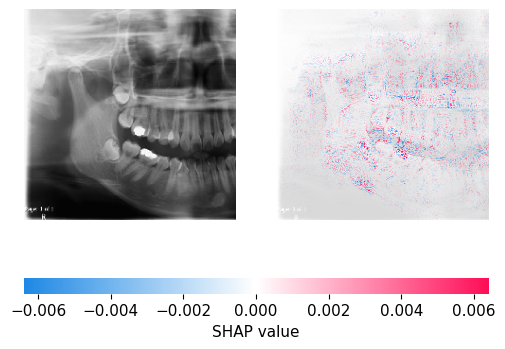

In [124]:
shap_values_E244_23Y_F = explainer_layer2.shap_values(background_test_array[[620]])
%matplotlib inline
shap.image_plot(shap_values_E244_23Y_F, background_test_array[[620]])

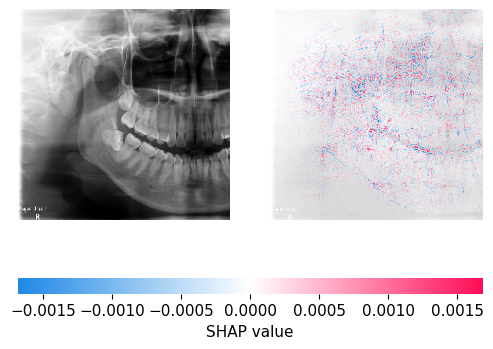

In [125]:
shap_values_E280_23Y_F = explainer_layer2.shap_values(background_test_array[[622]])
%matplotlib inline
shap.image_plot(shap_values_E280_23Y_F, background_test_array[[622]])

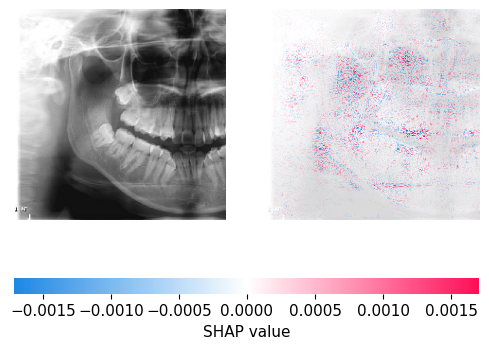

In [126]:
shap_values_FlipE283_23Y_F = explainer_layer2.shap_values(background_test_array[[627]])
%matplotlib inline
shap.image_plot(shap_values_FlipE283_23Y_F, background_test_array[[627]])

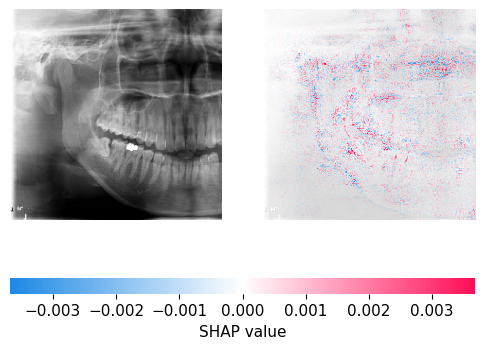

In [127]:
shap_values_FlipE109_23Y_F = explainer_layer2.shap_values(background_test_array[[634]])
%matplotlib inline
shap.image_plot(shap_values_FlipE109_23Y_F, background_test_array[[634]])

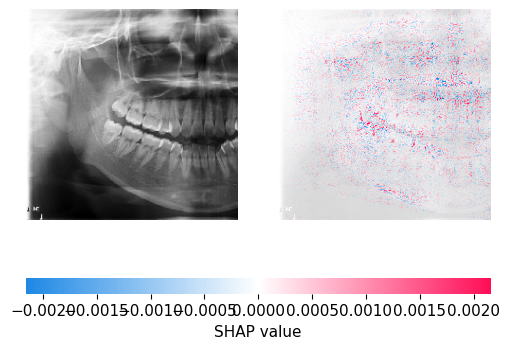

In [128]:
shap_values_FlipE150_23Y_F = explainer_layer2.shap_values(background_test_array[[642]])
%matplotlib inline
shap.image_plot(shap_values_FlipE150_23Y_F, background_test_array[[642]])

#### convert shap value from RGB to grayscale image

In [129]:
type(shap_values_FlipE109_23Y_F)

list

#### E244_23Y_F

In [130]:
#E244_23Y_F
data= [np.array(shap_values_E244_23Y_F)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [131]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

In [132]:
grayscale_neg_thresholded

array([[          0,           0,           0, ...,           0,           0,           0],
       [          0,           0,           0, ...,           0,           0,           0],
       [          0,           0,           0, ...,           0,           0,           0],
       ...,
       [          0,           0,           0, ...,           0,           0,           0],
       [          0,           0,           0, ...,           0,           0,           0],
       [          0,           0,           0, ...,           0,           0,           0]])

In [133]:
import numpy as np

total_sum = np.sum(grayscale_neg_thresholded)
print("Total Sum:", total_sum)

# Calculating the mean of all values in the array
mean_value = np.mean(grayscale_neg_thresholded)
print("Mean Value:", mean_value)


Total Sum: 80.7950402508559
Mean Value: 0.0016102327856117647


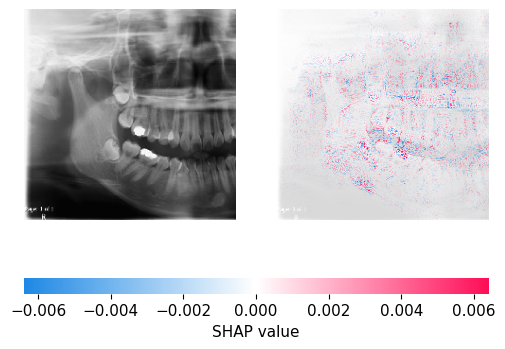

In [134]:
shap.image_plot(shap_values_E244_23Y_F, background_test_array[[620]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

In [135]:
shap_values_E244_23Y_F

[array([[[[-2.6117e-05,  3.5342e-05, -1.1886e-05],
          [-2.2888e-05,  3.7238e-05, -1.3858e-05],
          [-2.9747e-05,  7.7833e-05, -2.1198e-05],
          ...,
          [ 3.0633e-05,  -1.148e-05, -2.7451e-05],
          [  0.0001026, -1.8821e-05, -7.1954e-05],
          [ 6.0545e-05, -1.4317e-05, -6.0941e-05]],
 
         [[-8.7789e-06,   4.858e-05, -1.4718e-05],
          [-5.2822e-06,   4.961e-05, -2.3551e-05],
          [-1.3009e-05,    8.57e-05,  -3.159e-05],
          ...,
          [-5.8222e-05, -5.6275e-05, -3.0487e-05],
          [-3.1676e-05, -4.1821e-05, -5.4107e-05],
          [-3.5541e-05, -0.00013705, -7.6782e-05]],
 
         [[-3.1395e-05,  6.9215e-05,  -2.191e-05],
          [ 4.0307e-07,  1.6655e-05, -4.4365e-05],
          [-6.4952e-06,  5.9736e-05, -4.0184e-05],
          ...,
          [ -0.0002287,  3.6137e-05,  7.4366e-05],
          [-0.00012867,  4.0078e-05,  6.6736e-05],
          [-5.9451e-05,   1.969e-07,  2.2454e-05]],
 
         ...,
 
         [[ 

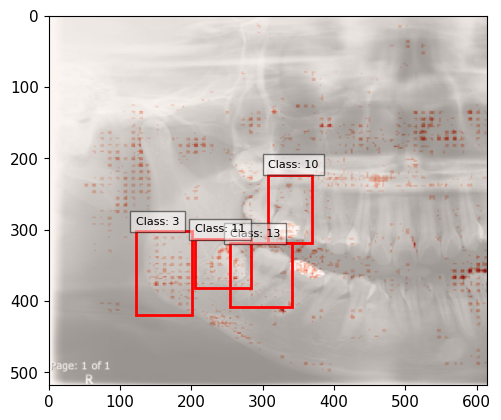

In [136]:
selected_bboxes_E244_23Y_F_pos = plot_bboxes_on_image_pos(Image_E244_23Y_F_path, df_E244_23Y_F_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [137]:
pd.DataFrame(selected_bboxes_E244_23Y_F_pos[0])

,xmin,ymin,xmax,ymax,confidence,class,name,iou
0,253.851458,319.058512,341.424510,407.724200,0.930287,13,Lower Second Molar,1.0
1,204.745448,313.292413,284.030266,381.741201,0.922186,11,Lower Third Molar,1.0
2,122.153713,302.218712,200.685276,419.194308,0.890187,3,Mandibular angle,1.0
3,307.961410,223.264049,369.051592,319.069720,0.853164,10,Upper First Molar,1.0


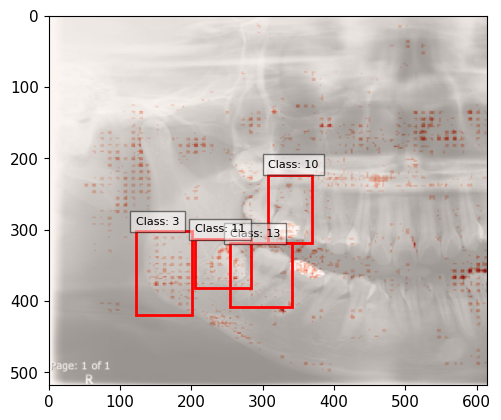

([{'xmin': 253.85145795345306,
   'ymin': 319.0585124492645,
   'xmax': 341.42450964450836,
   'ymax': 407.7242000102997,
   'confidence': 0.9302874803543091,
   'class': 13,
   'name': 'Lower Second Molar',
   'iou': 1.0},
  {'xmin': 204.74544835090637,
   'ymin': 313.29241335392,
   'xmax': 284.03026551008224,
   'ymax': 381.74120128154755,
   'confidence': 0.922186017036438,
   'class': 11,
   'name': 'Lower Third Molar',
   'iou': 1.0},
  {'xmin': 122.15371266007423,
   'ymin': 302.21871197223663,
   'xmax': 200.68527603149414,
   'ymax': 419.19430816173553,
   'confidence': 0.89018714427948,
   'class': 3,
   'name': 'Mandibular angle',
   'iou': 1.0},
  {'xmin': 307.9614098072052,
   'ymin': 223.26404857635498,
   'xmax': 369.0515921115875,
   'ymax': 319.0697201490402,
   'confidence': 0.8531637191772461,
   'class': 10,
   'name': 'Upper First Molar',
   'iou': 1.0}],
 [0.11217948717948718,
  0.17126436781609194,
  0.13049357674104126,
  0.12416851441241686])

In [138]:
plot_bboxes_on_image_pos(Image_E244_23Y_F_path, df_E244_23Y_F_filtered_nms, grayscale_pos_thresholded)

In [139]:
selected_bboxes_E244_23Y_F_pos[1]

[0.11217948717948718,
 0.17126436781609194,
 0.13049357674104126,
 0.12416851441241686]

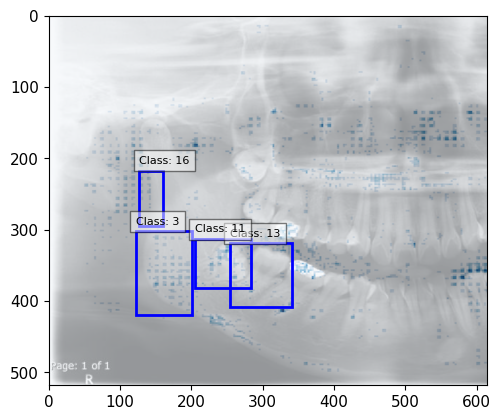

In [140]:
selected_bboxes_E244_23Y_F_neg = plot_bboxes_on_image_neg(Image_E244_23Y_F_path, df_E244_23Y_F_filtered_nms, grayscale_neg_thresholded)

In [141]:
pd.DataFrame(selected_bboxes_E244_23Y_F_neg[0])

,xmin,ymin,xmax,ymax,confidence,class,name,iou
0,253.851458,319.058512,341.424510,407.724200,0.930287,13,Lower Second Molar,1.0
1,204.745448,313.292413,284.030266,381.741201,0.922186,11,Lower Third Molar,1.0
2,122.153713,302.218712,200.685276,419.194308,0.890187,3,Mandibular angle,1.0
3,127.224024,217.171213,160.606473,294.952603,0.777768,16,Posterior border of Ramus,1.0


In [216]:
selected_bboxes_E244_23Y_F_neg[1]

[0.10096153846153846,
 0.15862068965517243,
 0.13995943204868155,
 0.10049019607843138]

#### E280_23Y_F

In [85]:
#E280_23Y_F
data= [np.array(shap_values_E280_23Y_F)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [86]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

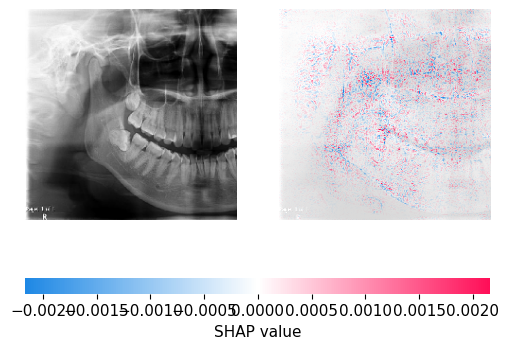

In [87]:
shap.image_plot(shap_values_E280_23Y_F, background_test_array[[622]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

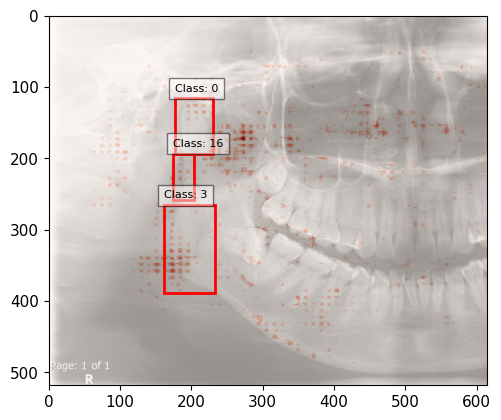

In [88]:
selected_bboxes_E280_23Y_F_pos = plot_bboxes_on_image_pos(Image_E280_23Y_F_path, df_E280_23Y_F_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [89]:
pd.DataFrame(selected_bboxes_E280_23Y_F_pos[0])

,xmin,ymin,xmax,ymax,confidence,class,name
0,176.529443,115.836247,230.432218,193.199934,0.909768,0,Condyle
1,161.250822,265.611277,233.248870,388.074848,0.904476,3,Mandibular angle
2,174.100447,193.660114,202.979302,258.246521,0.744464,16,Posterior border of Ramus


In [90]:
a = selected_bboxes_E280_23Y_F_pos[1]

In [91]:
a

[0.13787878787878788, 0.17120894479385046, 0.17532467532467533]

In [ ]:
for i in a:
  print(i)


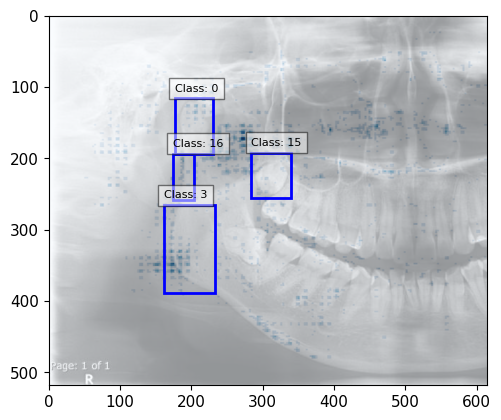

In [98]:
selected_bboxes_E280_23Y_F_neg = plot_bboxes_on_image_neg(Image_E280_23Y_F_path, df_E280_23Y_F_filtered_nms, grayscale_neg_thresholded)

In [99]:
import pandas as pd

def compute_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def nms_per_class(df, iou_threshold=0.5):
    # Initialize an empty DataFrame to store NMS results
    df_nms = pd.DataFrame()

    # Get unique class IDs
    class_ids = df['class'].unique()

    for class_id in class_ids:
        # Filter detections by class
        df_class = df[df['class'] == class_id].copy()

        # Sort detections by confidence in descending order
        df_class_sorted = df_class.sort_values(by='confidence', ascending=False).reset_index(drop=True)
        suppressed_indices = set()

        for i in range(len(df_class_sorted)):
            if i in suppressed_indices:
                continue

            for j in range(i+1, len(df_class_sorted)):
                if j in suppressed_indices:
                    continue

                boxA = df_class_sorted.iloc[i][['xmin', 'ymin', 'xmax', 'ymax']].values
                boxB = df_class_sorted.iloc[j][['xmin', 'ymin', 'xmax', 'ymax']].values

                if compute_iou(boxA, boxB) > iou_threshold:
                    suppressed_indices.add(j)

        # Filter out suppressed detections
        df_nms_class = df_class_sorted.drop(index=list(suppressed_indices)).reset_index(drop=True)

        # Append results for this class to the main DataFrame
        df_nms = pd.concat([df_nms, df_nms_class], ignore_index=True)

    return df_nms

# Example usage:
# Assuming 'df' is your DataFrame containing the detections
# result_df = nms_per_class(df)

In [102]:
import pandas as pd

def compute_iou(boxA, boxB):
    # Determine the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both the prediction and ground-truth rectangles
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

def nms_per_class(df, iou_threshold=0.5):
    # Initialize an empty DataFrame to store NMS results
    df_nms = pd.DataFrame()

    # Get unique class IDs
    class_ids = df['class'].unique()

    for class_id in class_ids:
        # Filter detections by class
        df_class = df[df['class'] == class_id].copy()

        # Sort detections by decreasing confidence
        df_class_sorted = df_class.sort_values(by='confidence', ascending=False).reset_index(drop=True)
        suppressed_indices = set()

        for i in range(len(df_class_sorted)):
            if i in suppressed_indices:
                continue

            for j in range(i+1, len(df_class_sorted)):
                if j in suppressed_indices:
                    continue

                boxA = df_class_sorted.iloc[i][['xmin', 'ymin', 'xmax', 'ymax']].values
                boxB = df_class_sorted.iloc[j][['xmin', 'ymin', 'xmax', 'ymax']].values

                if compute_iou(boxA, boxB) > iou_threshold:
                    suppressed_indices.add(j)

        # Filter out suppressed detections
        df_nms_class = df_class_sorted.drop(index=list(suppressed_indices)).reset_index(drop=True)

        # Append results for this class to the main DataFrame
        df_nms = pd.concat([df_nms, df_nms_class], ignore_index=True)

    return df_nms


In [100]:
pd.DataFrame(selected_bboxes_E280_23Y_F_pos[0])

,xmin,ymin,xmax,ymax,confidence,class,name
0,176.529443,115.836247,230.432218,193.199934,0.909768,0,Condyle
1,161.250822,265.611277,233.248870,388.074848,0.904476,3,Mandibular angle
2,174.100447,193.660114,202.979302,258.246521,0.744464,16,Posterior border of Ramus


#### FlipE283_23Y_F

In [143]:
#FlipE283_23Y_F
data= [np.array(shap_values_FlipE283_23Y_F)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [144]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

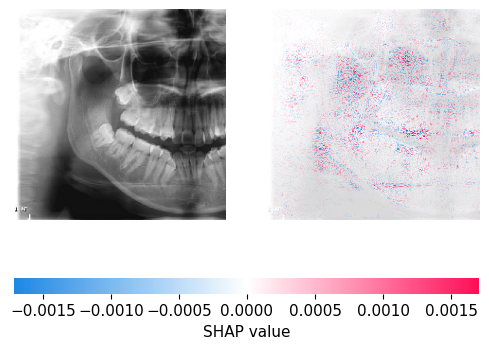

In [145]:
shap.image_plot(shap_values_FlipE283_23Y_F, background_test_array[[627]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

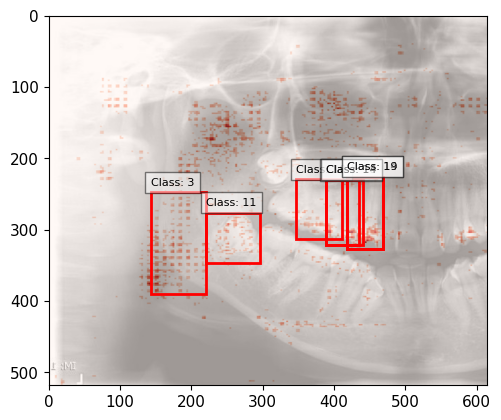

In [146]:
selected_bboxes_FlipE283_23Y_F_pos = plot_bboxes_on_image_pos(Image_FlipE283_23Y_F_path, df_FlipE283_23Y_F_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [147]:
pd.DataFrame(selected_bboxes_FlipE283_23Y_F_pos)

,0,1,2,3,4,5,6
0,"{'xmin': 220.85120356082916, 'ymin': 276.38323497772217, 'xmax': 295.91121566295624, 'ymax': 346.30143570899963, 'confidence': 0.9237716794013977, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 346.96584594249725, 'ymin': 229.45844852924347, 'xmax': 411.23102283477783, 'ymax': 313.131862282753, 'confidence': 0.892859160900116, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 143.08386400341988, 'ymin': 247.62677824497223, 'xmax': 220.97581720352173, 'ymax': 390.55780160427094, 'confidence': 0.877819299697876, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}","{'xmin': 388.15059995651245, 'ymin': 230.50074917078018, 'xmax': 434.5825947523117, 'ymax': 321.5072867870331, 'confidence': 0.8235533237457275, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 418.4172226190567, 'ymin': 225.42875558137894, 'xmax': 469.10427010059357, 'ymax': 326.6382520198822, 'confidence': 0.6621807813644409, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 388.74464654922485, 'ymin': 230.1893418431282, 'xmax': 439.86650598049164, 'ymax': 320.98802757263184, 'confidence': 0.2749444544315338, 'class': 14, 'name': 'Upper First Premolar', 'iou': 0.9004190597956572}","{'xmin': 418.6273274421692, 'ymin': 225.7514477968216, 'xmax': 469.10379433631897, 'ymax': 327.3065458536148, 'confidence': 0.627665638923645, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}"
1,0.169136,0.116898,0.206674,0.135294,0.208134,0.155196,0.208134


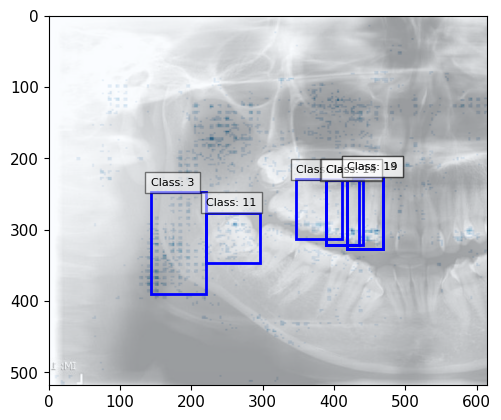

In [148]:
selected_bboxes_FlipE283_23Y_F_neg = plot_bboxes_on_image_neg(Image_FlipE283_23Y_F_path, df_FlipE283_23Y_F_filtered_nms, grayscale_neg_thresholded)

In [149]:
pd.DataFrame(selected_bboxes_FlipE283_23Y_F_neg)

,0,1,2,3,4,5,6
0,"{'xmin': 220.85120356082916, 'ymin': 276.38323497772217, 'xmax': 295.91121566295624, 'ymax': 346.30143570899963, 'confidence': 0.9237716794013977, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 346.96584594249725, 'ymin': 229.45844852924347, 'xmax': 411.23102283477783, 'ymax': 313.131862282753, 'confidence': 0.892859160900116, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 143.08386400341988, 'ymin': 247.62677824497223, 'xmax': 220.97581720352173, 'ymax': 390.55780160427094, 'confidence': 0.877819299697876, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}","{'xmin': 388.15059995651245, 'ymin': 230.50074917078018, 'xmax': 434.5825947523117, 'ymax': 321.5072867870331, 'confidence': 0.8235533237457275, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 418.4172226190567, 'ymin': 225.42875558137894, 'xmax': 469.10427010059357, 'ymax': 326.6382520198822, 'confidence': 0.6621807813644409, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 388.74464654922485, 'ymin': 230.1893418431282, 'xmax': 439.86650598049164, 'ymax': 320.98802757263184, 'confidence': 0.2749444544315338, 'class': 14, 'name': 'Upper First Premolar', 'iou': 0.9004190597956572}","{'xmin': 418.6273274421692, 'ymin': 225.7514477968216, 'xmax': 469.10379433631897, 'ymax': 327.3065458536148, 'confidence': 0.627665638923645, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}"
1,0.17037,0.148148,0.196721,0.147059,0.185407,0.157895,0.185407


#### FlipE109_23Y_F

In [150]:
#FlipE109_23Y_F
data= [np.array(shap_values_FlipE109_23Y_F)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [151]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

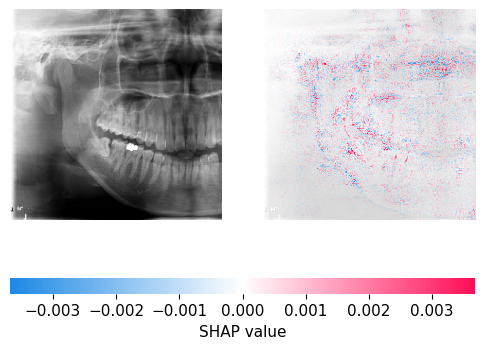

In [152]:
shap.image_plot(shap_values_FlipE109_23Y_F, background_test_array[[634]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

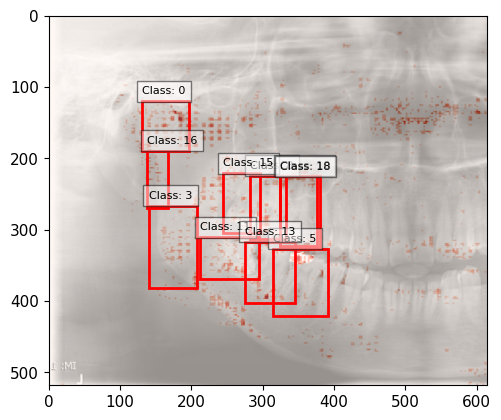

In [153]:
selected_bboxes_FlipE109_23Y_F_pos = plot_bboxes_on_image_pos(Image_FlipE109_23Y_F_path, df_FlipE109_23Y_F_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [154]:
pd.DataFrame(selected_bboxes_FlipE109_23Y_F_pos)

,0,1,2,3,4,5,6,7,8,9
0,"{'xmin': 314.7880049943924, 'ymin': 326.46544349193573, 'xmax': 391.6412824392319, 'ymax': 421.17140197753906, 'confidence': 0.9265553951263428, 'class': 5, 'name': 'Lower First Molar', 'iou': 1.0}","{'xmin': 212.6297956109047, 'ymin': 310.51274943351746, 'xmax': 294.3547894358635, 'ymax': 369.09187638759613, 'confidence': 0.9227030277252197, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 282.4181565642357, 'ymin': 224.28763884305954, 'xmax': 332.3379975557327, 'ymax': 313.2062715291977, 'confidence': 0.9167029857635498, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 244.4065489768982, 'ymin': 220.90860998630524, 'xmax': 296.44268095493317, 'ymax': 304.7054936885834, 'confidence': 0.9150039553642273, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 323.5327719449997, 'ymin': 224.43411082029343, 'xmax': 375.6905165910721, 'ymax': 323.278072476387, 'confidence': 0.9147897362709045, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 274.94787061214447, 'ymin': 317.17549538612366, 'xmax': 345.33086371421814, 'ymax': 403.11755752563477, 'confidence': 0.9120615124702454, 'class': 13, 'name': 'Lower Second Molar', 'iou': 1.0}","{'xmin': 130.94860869646072, 'ymin': 119.96136754751205, 'xmax': 196.11449885368347, 'ymax': 190.3379261493683, 'confidence': 0.9065572023391724, 'class': 0, 'name': 'Condyle', 'iou': 1.0}","{'xmin': 324.68313336372375, 'ymin': 225.3559055328369, 'xmax': 379.95277893543243, 'ymax': 325.0399043560028, 'confidence': 0.29204121232032776, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.8960686238857792}","{'xmin': 140.53842449188232, 'ymin': 266.6925575733185, 'xmax': 208.0385788679123, 'ymax': 381.77136635780334, 'confidence': 0.8216453790664673, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}","{'xmin': 137.56715765595436, 'ymin': 189.02756696939468, 'xmax': 166.47495180368423, 'ymax': 269.05376982688904, 'confidence': 0.7122782468795776, 'class': 16, 'name': 'Posterior border of Ramus', 'iou': 1.0}"
1,0.112369,0.178667,0.18661,0.119883,0.146617,0.128649,0.275538,0.145349,0.111667,0.122857


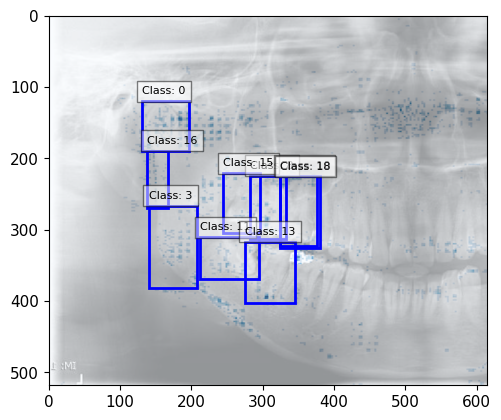

In [155]:
selected_bboxes_FlipE109_23Y_F_neg = plot_bboxes_on_image_neg(Image_FlipE109_23Y_F_path, df_FlipE109_23Y_F_filtered_nms, grayscale_neg_thresholded)

In [156]:
pd.DataFrame(selected_bboxes_FlipE109_23Y_F_neg)

,0,1,2,3,4,5,6,7,8
0,"{'xmin': 212.6297956109047, 'ymin': 310.51274943351746, 'xmax': 294.3547894358635, 'ymax': 369.09187638759613, 'confidence': 0.9227030277252197, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 282.4181565642357, 'ymin': 224.28763884305954, 'xmax': 332.3379975557327, 'ymax': 313.2062715291977, 'confidence': 0.9167029857635498, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 244.4065489768982, 'ymin': 220.90860998630524, 'xmax': 296.44268095493317, 'ymax': 304.7054936885834, 'confidence': 0.9150039553642273, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 323.5327719449997, 'ymin': 224.43411082029343, 'xmax': 375.6905165910721, 'ymax': 323.278072476387, 'confidence': 0.9147897362709045, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 274.94787061214447, 'ymin': 317.17549538612366, 'xmax': 345.33086371421814, 'ymax': 403.11755752563477, 'confidence': 0.9120615124702454, 'class': 13, 'name': 'Lower Second Molar', 'iou': 1.0}","{'xmin': 130.94860869646072, 'ymin': 119.96136754751205, 'xmax': 196.11449885368347, 'ymax': 190.3379261493683, 'confidence': 0.9065572023391724, 'class': 0, 'name': 'Condyle', 'iou': 1.0}","{'xmin': 324.68313336372375, 'ymin': 225.3559055328369, 'xmax': 379.95277893543243, 'ymax': 325.0399043560028, 'confidence': 0.29204121232032776, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.8960686238857792}","{'xmin': 140.53842449188232, 'ymin': 266.6925575733185, 'xmax': 208.0385788679123, 'ymax': 381.77136635780334, 'confidence': 0.8216453790664673, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}","{'xmin': 137.56715765595436, 'ymin': 189.02756696939468, 'xmax': 166.47495180368423, 'ymax': 269.05376982688904, 'confidence': 0.7122782468795776, 'class': 16, 'name': 'Posterior border of Ramus', 'iou': 1.0}"
1,0.126667,0.189459,0.102339,0.14411,0.100541,0.274194,0.140698,0.113333,0.151429


#### FlipE150_23Y_F

In [157]:
#FlipE150_23Y_F
data= [np.array(shap_values_FlipE150_23Y_F)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [158]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

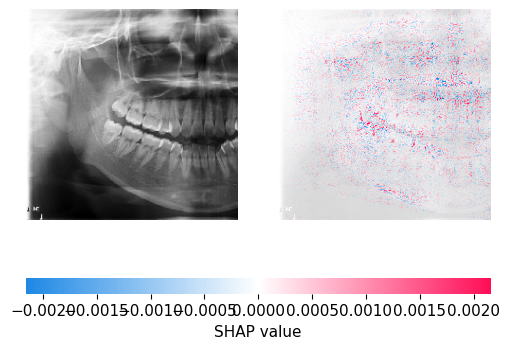

In [159]:
shap.image_plot(shap_values_FlipE150_23Y_F, background_test_array[[642]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

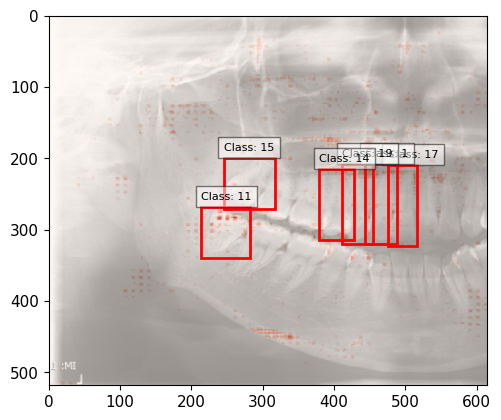

In [160]:
selected_bboxes_FlipE150_23Y_F_pos = plot_bboxes_on_image_pos(Image_FlipE150_23Y_F_path, df_FlipE150_23Y_F_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [161]:
pd.DataFrame(selected_bboxes_FlipE150_23Y_F_pos)

,0,1,2,3,4,5
0,"{'xmin': 214.07619220018387, 'ymin': 268.07740318775177, 'xmax': 281.49023324251175, 'ymax': 339.46736323833466, 'confidence': 0.9144601821899414, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 245.34283477067947, 'ymin': 199.2672518491745, 'xmax': 316.7754553556442, 'ymax': 270.69135987758636, 'confidence': 0.9116476774215698, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 475.27533531188965, 'ymin': 208.82961189746857, 'xmax': 516.5442630052567, 'ymax': 322.7037627696991, 'confidence': 0.8702369928359985, 'class': 17, 'name': 'Upper Central Incisor', 'iou': 1.0}","{'xmin': 443.86567068099976, 'ymin': 207.92410385608673, 'xmax': 487.6003016233444, 'ymax': 320.6011303663254, 'confidence': 0.8655357956886292, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 411.4065066576004, 'ymin': 207.58682310581207, 'xmax': 454.18488800525665, 'ymax': 320.3674668073654, 'confidence': 0.8361989855766296, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 379.18983602523804, 'ymin': 214.71504366397858, 'xmax': 427.6685321331024, 'ymax': 314.6235669851303, 'confidence': 0.7686640620231628, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}"
1,0.182796,0.101737,0.14966,0.145408,0.163265,0.116162


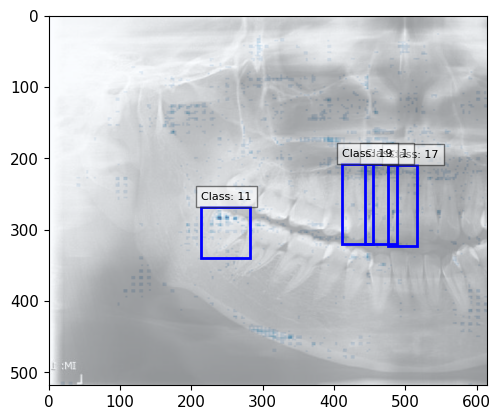

In [162]:
selected_bboxes_FlipE150_23Y_F_neg = plot_bboxes_on_image_neg(Image_FlipE150_23Y_F_path, df_FlipE150_23Y_F_filtered_nms, grayscale_neg_thresholded)

In [163]:
pd.DataFrame(selected_bboxes_FlipE150_23Y_F_neg)

,0,1,2,3
0,"{'xmin': 214.07619220018387, 'ymin': 268.07740318775177, 'xmax': 281.49023324251175, 'ymax': 339.46736323833466, 'confidence': 0.9144601821899414, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 475.27533531188965, 'ymin': 208.82961189746857, 'xmax': 516.5442630052567, 'ymax': 322.7037627696991, 'confidence': 0.8702369928359985, 'class': 17, 'name': 'Upper Central Incisor', 'iou': 1.0}","{'xmin': 443.86567068099976, 'ymin': 207.92410385608673, 'xmax': 487.6003016233444, 'ymax': 320.6011303663254, 'confidence': 0.8655357956886292, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 411.4065066576004, 'ymin': 207.58682310581207, 'xmax': 454.18488800525665, 'ymax': 320.3674668073654, 'confidence': 0.8361989855766296, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}"
1,0.185484,0.141497,0.173469,0.160544


### Male

#### เลือกรูปที่ต้องการหาค่า SHAP Value

In [164]:
sdf_test[sdf_test['Age(year)']==23]

,Age(year),Gender,Folder_type,Folder_name,Path_Name,...,Age_predict_int,Gender_predict,Gender_predict_str,Gender_predict_int,prob
620,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E244.jpg,...,17.0,1.164632e-03,Female,0.0,0.998835
621,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE244.jpg,...,16.0,8.527467e-06,Female,0.0,0.999991
622,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E280.jpg,...,20.0,5.426764e-08,Female,0.0,1.000000
623,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE280.jpg,...,20.0,3.515463e-08,Female,0.0,1.000000
624,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E282.jpg,...,18.0,6.476362e-07,Female,0.0,0.999999
625,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE282.jpg,...,18.0,3.930597e-07,Female,0.0,1.000000
626,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E283.jpg,...,22.0,6.199880e-06,Female,0.0,0.999994
627,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE283.jpg,...,21.0,1.564497e-07,Female,0.0,1.000000
628,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/E284.jpg,...,21.0,3.299725e-09,Female,0.0,1.000000
629,23,F,Normal,Both,/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/F/Both/FlipE284.jpg,...,21.0,9.005191e-08,Female,0.0,1.000000


In [165]:
from PIL import Image
Image_E411_23Y_M = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E411.jpg')
Image_E411_23Y_M_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E411.jpg'

Image_E412_23Y_M = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E412.jpg')
Image_E412_23Y_M_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E412.jpg'

Image_FlipE238_23Y_M = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE238.jpg')
Image_FlipE238_23Y_M_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE238.jpg'

Image_FlipE274_23Y_M = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE274.jpg')
Image_FlipE274_23Y_M_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE274.jpg'

Image_E15_23Y_M = Image.open('/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Rt/E15.jpg')
Image_E15_23Y_M_path = '/content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Rt/E15.jpg'

In [166]:
sdf_test.reset_index().iloc[643]

index                                                                                                               643
Age(year)                                                                                                            23
Gender                                                                                                                M
Folder_type                                                                                                      Normal
Folder_name                                                                                                        Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E411.jpg
Filename                                                                                                       E411.jpg
Gender_Class                                                                                                          1
Gender_Predict                          

In [167]:
sdf_test.reset_index().iloc[645]

index                                                                                                               645
Age(year)                                                                                                            23
Gender                                                                                                                M
Folder_type                                                                                                      Normal
Folder_name                                                                                                        Both
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Both/E412.jpg
Filename                                                                                                       E412.jpg
Gender_Class                                                                                                          1
Gender_Predict                          

In [168]:
sdf_test.reset_index().iloc[647] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                                 647
Age(year)                                                                                                              23
Gender                                                                                                                  M
Folder_type                                                                                                        Normal
Folder_name                                                                                                            Lt
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE238.jpg
Filename                                                                                                     FlipE238.jpg
Gender_Class                                                                                                            1
Gender_Predict          

In [169]:
sdf_test.reset_index().iloc[648] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                                 648
Age(year)                                                                                                              23
Gender                                                                                                                  M
Folder_type                                                                                                        Normal
Folder_name                                                                                                            Lt
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Lt/FlipE274.jpg
Filename                                                                                                     FlipE274.jpg
Gender_Class                                                                                                            1
Gender_Predict          

In [170]:
sdf_test.reset_index().iloc[654] # check ว่า ตรงไหนจากภาพที่เลทอกมา

index                                                                                                            654
Age(year)                                                                                                         23
Gender                                                                                                             M
Folder_type                                                                                                   Normal
Folder_name                                                                                                       Rt
Path_Name             /content/gdrive/MyDrive/Tooth_Shap_GPT/Deep_tooth/Data_Cut_images/Test/Normal/23Y/M/Rt/E15.jpg
Filename                                                                                                     E15.jpg
Gender_Class                                                                                                       1
Gender_Predict                                                  

#### YOLO (detect ตห)

In [171]:
# YOLO detect ตำแหน่ง
#ภาพ1
results_E411_23Y_M = yolo_model(Image_E411_23Y_M) # results = ผลจากการทำนาย
df_E411_23Y_M = results_E411_23Y_M.pandas().xyxyn[0] #.pandas ทำให้เป็น dataframe // .xyxy ตห.กล่อง ///  n normalization ค่าให้มีค่าอยู่ระหว่าง 0-1 //[0]= index
#ภาพ2
results_E412_23Y_M = yolo_model(Image_E412_23Y_M)
df_E412_23Y_M = results_E412_23Y_M.pandas().xyxyn[0]
#ภาพ3
results_FlipE238_23Y_M  = yolo_model(Image_FlipE238_23Y_M )
df_FlipE238_23Y_M  = results_FlipE238_23Y_M .pandas().xyxyn[0]
#ภาพ4
results_FlipE274_23Y_M = yolo_model(Image_FlipE274_23Y_M)
df_FlipE274_23Y_M = results_FlipE274_23Y_M.pandas().xyxyn[0]
#ภาพ5
results_E15_23Y_M = yolo_model(Image_E15_23Y_M)
df_E15_23Y_M= results_E15_23Y_M.pandas().xyxyn[0]

In [172]:
results_E15_23Y_M

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 518x614 1 Condyle, 1 Upper Lateral Incisor, 1 Lower Lateral Incisor, 1 Mandibular angle, 1 Lower Central Incisor, 1 Lower First Molar, 2 Lower Second Premolars, 1 Nasal, 1 Upper Second Molar, 1 Lower Canine, 1 Upper First Molar, 1 Lower Third Molar, 1 Lower First Premolar, 1 Lower Second Molar, 1 Upper First Premolar, 1 Upper Third Molar, 1 Posterior border of Ramus, 1 Upper Central Incisor, 2 Upper Second Premolars, 1 Upper Canine
Speed: 7.3ms pre-process, 311.1ms inference, 1.3ms NMS per image at shape (1, 3, 544, 640)

##### NMS

In [173]:
df_E411_23Y_M_filtered_nms = nms_per_class(df_E411_23Y_M,iou_threshold=0.5)
df_E412_23Y_M_filtered_nms = nms_per_class(df_E412_23Y_M,iou_threshold=0.5)
df_FlipE238_23Y_M_filtered_nms = nms_per_class(df_FlipE238_23Y_M ,iou_threshold=0.5)
df_FlipE274_23Y_M_filtered_nms = nms_per_class(df_FlipE274_23Y_M,iou_threshold=0.5)
df_E15_23Y_M_filtered_nms = nms_per_class(df_E15_23Y_M,iou_threshold=0.5)

#### SHAP values

In [174]:
explainer_layer2

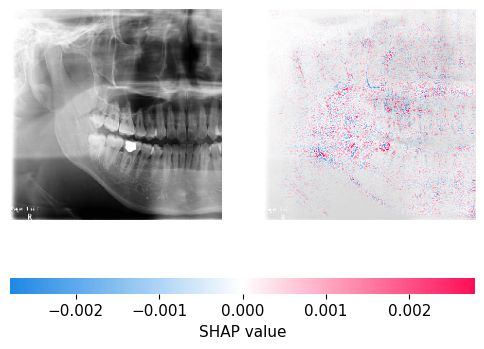

In [175]:
shap_values_E411_23Y_M = explainer_layer2.shap_values(background_test_array[[643]])
%matplotlib inline
shap.image_plot(shap_values_E411_23Y_M, background_test_array[[643]])

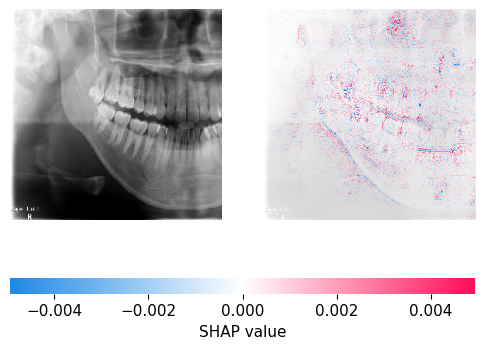

In [176]:
shap_values_E412_23Y_M = explainer_layer2.shap_values(background_test_array[[645]])
%matplotlib inline
shap.image_plot(shap_values_E412_23Y_M, background_test_array[[645]])

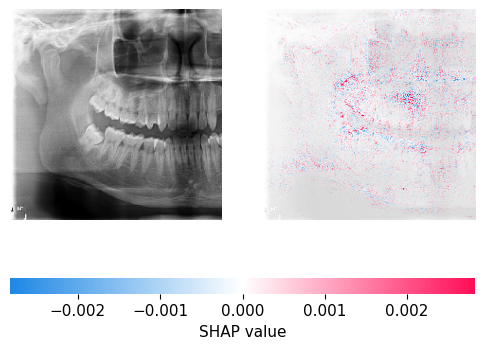

In [177]:
shap_values_FlipE238_23Y_M  = explainer_layer2.shap_values(background_test_array[[647]])
%matplotlib inline
shap.image_plot(shap_values_FlipE238_23Y_M , background_test_array[[647]])

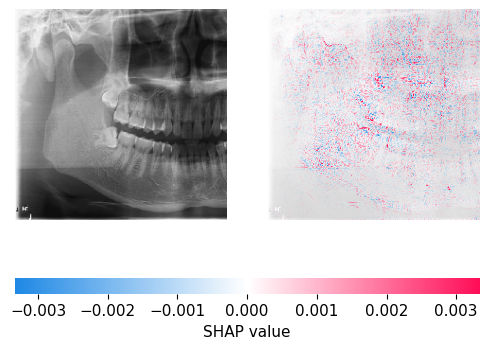

In [178]:
shap_values_FlipE274_23Y_M = explainer_layer2.shap_values(background_test_array[[648]])
%matplotlib inline
shap.image_plot(shap_values_FlipE274_23Y_M, background_test_array[[648]])

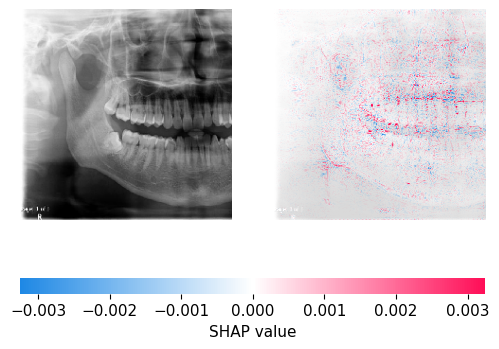

In [179]:
shap_values_E15_23Y_M = explainer_layer2.shap_values(background_test_array[[654]])
%matplotlib inline
shap.image_plot(shap_values_E15_23Y_M, background_test_array[[654]])

#### convert shap value from RGB to grayscale image

In [180]:
type(shap_values_FlipE274_23Y_M)

list

#### E411_23Y_M

In [181]:
#E411_23Y_M
data= [np.array(shap_values_E411_23Y_M)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [182]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

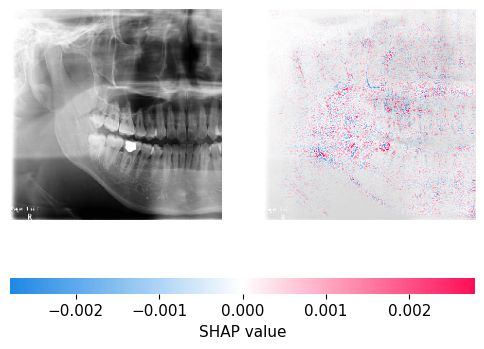

In [183]:
shap.image_plot(shap_values_E411_23Y_M, background_test_array[[643]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

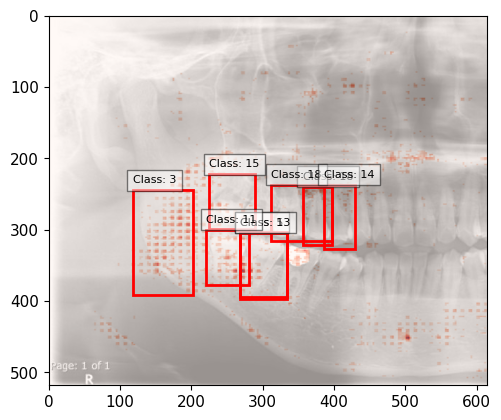

In [184]:
selected_bboxes_E411_23Y_M_pos = plot_bboxes_on_image_pos(Image_E411_23Y_M_path, df_E411_23Y_M_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [185]:
pd.DataFrame(selected_bboxes_E411_23Y_M_pos)

,0,1,2,3,4,5,6,7
0,"{'xmin': 268.33158153295517, 'ymin': 304.6499491930008, 'xmax': 333.91039848327637, 'ymax': 396.7505034208298, 'confidence': 0.45399558544158936, 'class': 5, 'name': 'Lower First Molar', 'iou': 0.8306833171120998}","{'xmin': 268.3776208758354, 'ymin': 303.78723418712616, 'xmax': 333.53663074970245, 'ymax': 394.4152572154999, 'confidence': 0.9084959030151367, 'class': 13, 'name': 'Lower Second Molar', 'iou': 1.0}","{'xmin': 221.08688986301422, 'ymin': 300.2149111032486, 'xmax': 280.79623955488205, 'ymax': 377.24348652362823, 'confidence': 0.9038689136505127, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 356.232745885849, 'ymin': 239.80352592468262, 'xmax': 397.1718957424164, 'ymax': 321.71569442749023, 'confidence': 0.870470404624939, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 311.9615626335144, 'ymin': 237.0996451973915, 'xmax': 397.192719578743, 'ymax': 315.6796225309372, 'confidence': 0.25501373410224915, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9236575198349659}","{'xmin': 225.2388846874237, 'ymin': 222.19397568702698, 'xmax': 289.67855727672577, 'ymax': 298.68053686618805, 'confidence': 0.8701866269111633, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 385.2495357990265, 'ymin': 237.16672158241272, 'xmax': 429.29366970062256, 'ymax': 326.70861661434174, 'confidence': 0.8652744293212891, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 117.73272803425789, 'ymin': 244.69357192516327, 'xmax': 201.84098064899445, 'ymax': 390.87442684173584, 'confidence': 0.8323975205421448, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}"
1,0.14375,0.144231,0.266043,0.177778,0.12334,0.14888,0.107372,0.248488


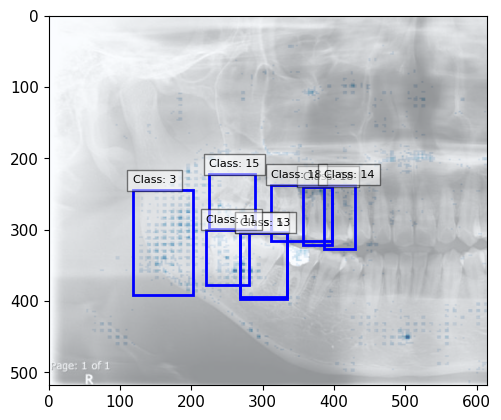

In [186]:
selected_bboxes_E411_23Y_M_neg = plot_bboxes_on_image_neg(Image_E411_23Y_M_path, df_E411_23Y_M_filtered_nms, grayscale_neg_thresholded)

In [187]:
pd.DataFrame(selected_bboxes_E411_23Y_M_neg)

,0,1,2,3,4,5,6,7
0,"{'xmin': 268.33158153295517, 'ymin': 304.6499491930008, 'xmax': 333.91039848327637, 'ymax': 396.7505034208298, 'confidence': 0.45399558544158936, 'class': 5, 'name': 'Lower First Molar', 'iou': 0.8306833171120998}","{'xmin': 268.3776208758354, 'ymin': 303.78723418712616, 'xmax': 333.53663074970245, 'ymax': 394.4152572154999, 'confidence': 0.9084959030151367, 'class': 13, 'name': 'Lower Second Molar', 'iou': 1.0}","{'xmin': 221.08688986301422, 'ymin': 300.2149111032486, 'xmax': 280.79623955488205, 'ymax': 377.24348652362823, 'confidence': 0.9038689136505127, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 356.232745885849, 'ymin': 239.80352592468262, 'xmax': 397.1718957424164, 'ymax': 321.71569442749023, 'confidence': 0.870470404624939, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 311.9615626335144, 'ymin': 237.0996451973915, 'xmax': 397.192719578743, 'ymax': 315.6796225309372, 'confidence': 0.25501373410224915, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9236575198349659}","{'xmin': 225.2388846874237, 'ymin': 222.19397568702698, 'xmax': 289.67855727672577, 'ymax': 298.68053686618805, 'confidence': 0.8701866269111633, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 385.2495357990265, 'ymin': 237.16672158241272, 'xmax': 429.29366970062256, 'ymax': 326.70861661434174, 'confidence': 0.8652744293212891, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 117.73272803425789, 'ymin': 244.69357192516327, 'xmax': 201.84098064899445, 'ymax': 390.87442684173584, 'confidence': 0.8323975205421448, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}"
1,0.121875,0.122863,0.26738,0.142593,0.104364,0.167325,0.11859,0.253024


#### E412_23Y_M

In [188]:
#E412_23Y_M
data= [np.array(shap_values_E412_23Y_M)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [189]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

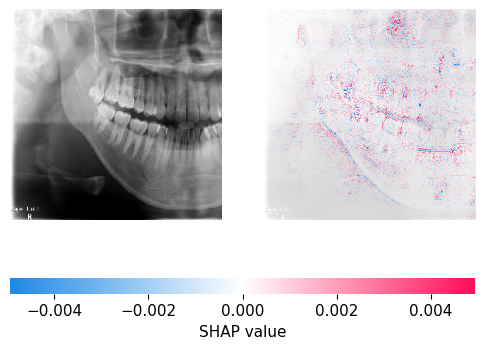

In [190]:
shap.image_plot(shap_values_E412_23Y_M, background_test_array[[645]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

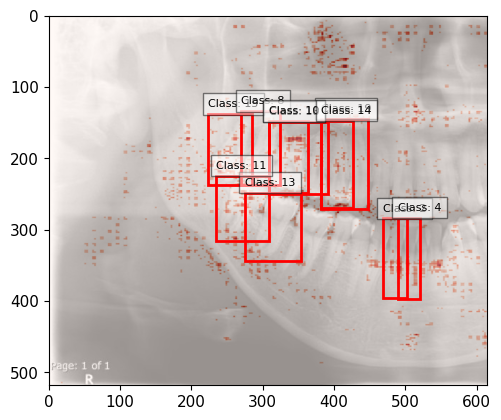

In [191]:
selected_bboxes_E412_23Y_M_pos = plot_bboxes_on_image_pos(Image_E412_23Y_M_path, df_E412_23Y_M_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [192]:
pd.DataFrame(selected_bboxes_E412_23Y_M_pos)

,0,1,2,3,4,5,6,7,8,9
0,"{'xmin': 275.1469047665596, 'ymin': 248.04076844453812, 'xmax': 353.26086604595184, 'ymax': 344.2155376672745, 'confidence': 0.9344934225082397, 'class': 13, 'name': 'Lower Second Molar', 'iou': 1.0}","{'xmin': 223.8664328455925, 'ymin': 137.98248428106308, 'xmax': 285.18915408849716, 'ymax': 237.3292641043663, 'confidence': 0.9277707934379578, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 234.79783070087433, 'ymin': 224.54478299617767, 'xmax': 309.2508407831192, 'ymax': 315.86462676525116, 'confidence': 0.9266363382339478, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 269.63296151161194, 'ymin': 133.74497032165527, 'xmax': 323.7480003833771, 'ymax': 237.76502132415771, 'confidence': 0.9233797788619995, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 381.5125538110733, 'ymin': 144.65447735786438, 'xmax': 447.3348705768585, 'ymax': 270.73705518245697, 'confidence': 0.31848397850990295, 'class': 19, 'name': 'Upper Canine', 'iou': 0.9215839685996567}","{'xmin': 308.2851856946945, 'ymin': 148.58762353658676, 'xmax': 391.3270950317383, 'ymax': 249.92190212011337, 'confidence': 0.3101101219654083, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9120264668969424}","{'xmin': 308.5345227718353, 'ymin': 147.8578108549118, 'xmax': 363.66187822818756, 'ymax': 249.17963129281998, 'confidence': 0.8834897875785828, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 381.869779586792, 'ymin': 147.6146840453148, 'xmax': 427.0300930738449, 'ymax': 269.8476948738098, 'confidence': 0.8724232912063599, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 467.9686939716339, 'ymin': 284.19067919254303, 'xmax': 502.3510435819626, 'ymax': 396.3696268796921, 'confidence': 0.8018812537193298, 'class': 2, 'name': 'Lower Lateral Incisor', 'iou': 1.0}","{'xmin': 489.26906311511993, 'ymin': 283.11375200748444, 'xmax': 520.6948305368423, 'ymax': 397.28813338279724, 'confidence': 0.7700750827789307, 'class': 4, 'name': 'Lower Central Incisor', 'iou': 1.0}"
1,0.10453,0.18908,0.182336,0.105556,0.105303,0.149242,0.177273,0.133255,0.144427,0.159555


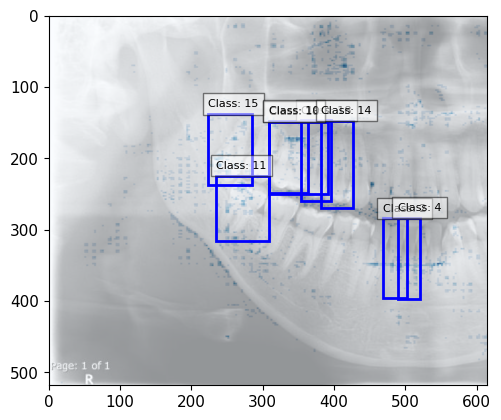

In [193]:
selected_bboxes_E412_23Y_M_neg = plot_bboxes_on_image_neg(Image_E412_23Y_M_path, df_E412_23Y_M_filtered_nms, grayscale_neg_thresholded)

In [194]:
pd.DataFrame(selected_bboxes_E412_23Y_M_neg)

,0,1,2,3,4,5,6,7
0,"{'xmin': 223.8664328455925, 'ymin': 137.98248428106308, 'xmax': 285.18915408849716, 'ymax': 237.3292641043663, 'confidence': 0.9277707934379578, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 234.79783070087433, 'ymin': 224.54478299617767, 'xmax': 309.2508407831192, 'ymax': 315.86462676525116, 'confidence': 0.9266363382339478, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 354.09638130664825, 'ymin': 146.82554465532303, 'xmax': 395.50038945674896, 'ymax': 260.2864154577255, 'confidence': 0.8902398347854614, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 308.2851856946945, 'ymin': 148.58762353658676, 'xmax': 391.3270950317383, 'ymax': 249.92190212011337, 'confidence': 0.3101101219654083, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9120264668969424}","{'xmin': 308.5345227718353, 'ymin': 147.8578108549118, 'xmax': 363.66187822818756, 'ymax': 249.17963129281998, 'confidence': 0.8834897875785828, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 381.869779586792, 'ymin': 147.6146840453148, 'xmax': 427.0300930738449, 'ymax': 269.8476948738098, 'confidence': 0.8724232912063599, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 467.9686939716339, 'ymin': 284.19067919254303, 'xmax': 502.3510435819626, 'ymax': 396.3696268796921, 'confidence': 0.8018812537193298, 'class': 2, 'name': 'Lower Lateral Incisor', 'iou': 1.0}","{'xmin': 489.26906311511993, 'ymin': 283.11375200748444, 'xmax': 520.6948305368423, 'ymax': 397.28813338279724, 'confidence': 0.7700750827789307, 'class': 4, 'name': 'Lower Central Incisor', 'iou': 1.0}"
1,0.167846,0.165242,0.115646,0.14697,0.160227,0.100236,0.150706,0.16141


#### FlipE238_23Y_M

In [195]:
#FlipE238_23Y_M
data= [np.array(shap_values_FlipE238_23Y_M)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [196]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

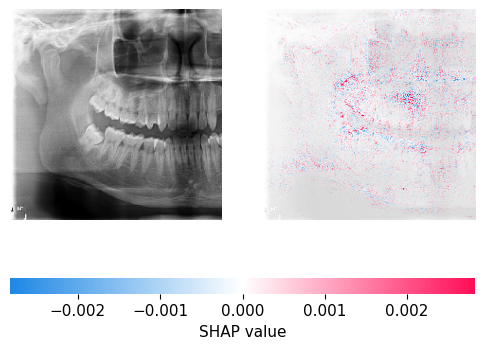

In [197]:
shap.image_plot(shap_values_FlipE238_23Y_M, background_test_array[[647]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

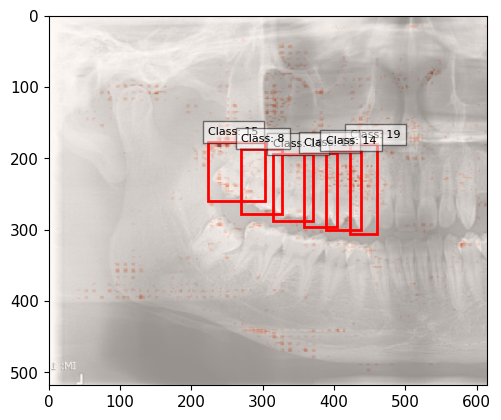

In [198]:
selected_bboxes_FlipE238_23Y_M_pos = plot_bboxes_on_image_pos(Image_FlipE238_23Y_M_path, df_FlipE238_23Y_M_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [199]:
pd.DataFrame(selected_bboxes_FlipE238_23Y_M_pos)

,0,1,2,3,4,5
0,"{'xmin': 314.03124701976776, 'ymin': 194.0851109623909, 'xmax': 369.79122257232666, 'ymax': 288.23641180992126, 'confidence': 0.9178460836410522, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 223.81232380867004, 'ymin': 177.2720329761505, 'xmax': 302.4522973895073, 'ymax': 260.2413376569748, 'confidence': 0.9051133394241333, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 269.5588337779045, 'ymin': 186.79315918684006, 'xmax': 327.52472698688507, 'ymax': 277.59502506256104, 'confidence': 0.8974586725234985, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 422.6001055240631, 'ymin': 180.40392124652863, 'xmax': 460.33081090450287, 'ymax': 305.73431730270386, 'confidence': 0.8822340965270996, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 358.22744250297546, 'ymin': 191.837488591671, 'xmax': 404.4116007089615, 'ymax': 295.5556881427765, 'confidence': 0.8788659572601318, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 388.1568214893341, 'ymin': 189.14158910512924, 'xmax': 437.87788450717926, 'ymax': 300.3384428024292, 'confidence': 0.8525176048278809, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}"
1,0.110976,0.199234,0.119048,0.22792,0.130719,0.225694


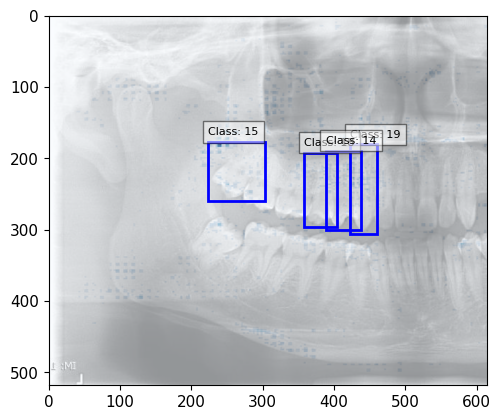

In [200]:
selected_bboxes_FlipE238_23Y_M_neg = plot_bboxes_on_image_neg(Image_FlipE238_23Y_M_path, df_FlipE238_23Y_M_filtered_nms, grayscale_neg_thresholded)

In [201]:
pd.DataFrame(selected_bboxes_FlipE238_23Y_M_neg)

,0,1,2,3
0,"{'xmin': 223.81232380867004, 'ymin': 177.2720329761505, 'xmax': 302.4522973895073, 'ymax': 260.2413376569748, 'confidence': 0.9051133394241333, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 422.6001055240631, 'ymin': 180.40392124652863, 'xmax': 460.33081090450287, 'ymax': 305.73431730270386, 'confidence': 0.8822340965270996, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 358.22744250297546, 'ymin': 191.837488591671, 'xmax': 404.4116007089615, 'ymax': 295.5556881427765, 'confidence': 0.8788659572601318, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 388.1568214893341, 'ymin': 189.14158910512924, 'xmax': 437.87788450717926, 'ymax': 300.3384428024292, 'confidence': 0.8525176048278809, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}"
1,0.179119,0.222222,0.132026,0.208333


#### FlipE274_23Y_M

In [202]:
#FlipE274_23Y_M
data= [np.array(shap_values_FlipE274_23Y_M)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [203]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

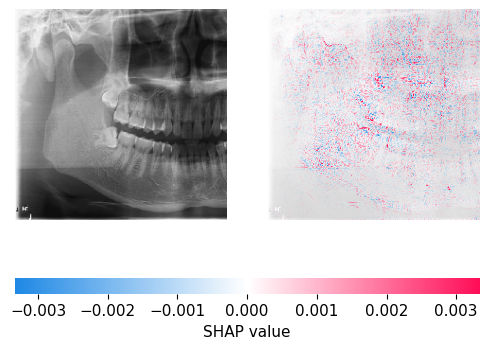

In [204]:
shap.image_plot(shap_values_FlipE274_23Y_M, background_test_array[[648]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

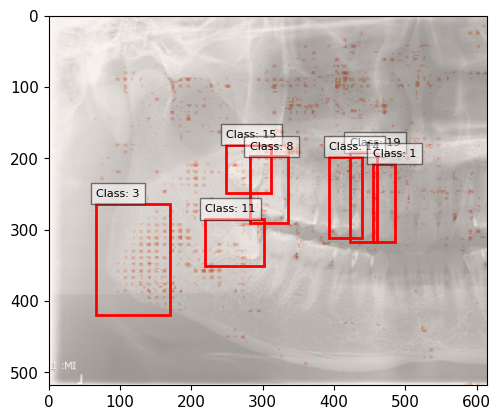

In [205]:
selected_bboxes_FlipE274_23Y_M_pos = plot_bboxes_on_image_pos(Image_FlipE274_23Y_M_path, df_FlipE274_23Y_M_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [206]:
pd.DataFrame(selected_bboxes_FlipE274_23Y_M_pos)

,0,1,2,3,4,5,6
0,"{'xmin': 219.546566426754, 'ymin': 285.2050223350525, 'xmax': 301.49209529161453, 'ymax': 350.20143735408783, 'confidence': 0.9226831197738647, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 248.76771539449692, 'ymin': 180.74475264549255, 'xmax': 312.2233427762985, 'ymax': 248.8263263106346, 'confidence': 0.8864847421646118, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 421.80180966854095, 'ymin': 191.72629153728485, 'xmax': 459.4206372499466, 'ymax': 316.51155495643616, 'confidence': 0.8820971846580505, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 281.4068281054497, 'ymin': 197.27212691307068, 'xmax': 335.60335075855255, 'ymax': 290.15898001194, 'confidence': 0.8747947216033936, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 392.90948700904846, 'ymin': 197.8499100804329, 'xmax': 438.8774652481079, 'ymax': 312.2571985721588, 'confidence': 0.8734928965568542, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}","{'xmin': 454.14005637168884, 'ymin': 207.68310743570328, 'xmax': 485.75601971149445, 'ymax': 317.33400869369507, 'confidence': 0.8730090856552124, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 66.34550650417805, 'ymin': 263.45532310009, 'xmax': 169.94711607694626, 'ymax': 418.9119544029236, 'confidence': 0.8203145861625671, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}"
1,0.123153,0.154423,0.128307,0.11875,0.108235,0.104167,0.111842


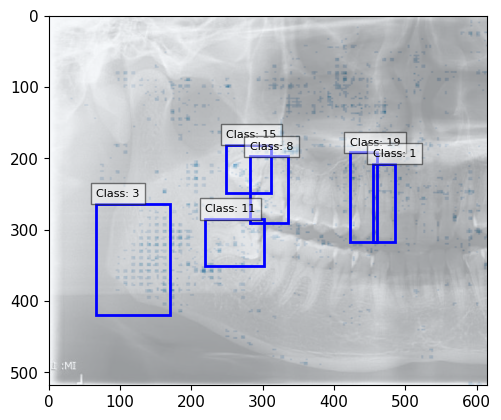

In [207]:
selected_bboxes_FlipE274_23Y_M_neg = plot_bboxes_on_image_neg(Image_FlipE274_23Y_M_path, df_FlipE274_23Y_M_filtered_nms, grayscale_neg_thresholded)

In [208]:
pd.DataFrame(selected_bboxes_FlipE274_23Y_M_neg)

,0,1,2,3,4,5
0,"{'xmin': 219.546566426754, 'ymin': 285.2050223350525, 'xmax': 301.49209529161453, 'ymax': 350.20143735408783, 'confidence': 0.9226831197738647, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 248.76771539449692, 'ymin': 180.74475264549255, 'xmax': 312.2233427762985, 'ymax': 248.8263263106346, 'confidence': 0.8864847421646118, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 421.80180966854095, 'ymin': 191.72629153728485, 'xmax': 459.4206372499466, 'ymax': 316.51155495643616, 'confidence': 0.8820971846580505, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 281.4068281054497, 'ymin': 197.27212691307068, 'xmax': 335.60335075855255, 'ymax': 290.15898001194, 'confidence': 0.8747947216033936, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 454.14005637168884, 'ymin': 207.68310743570328, 'xmax': 485.75601971149445, 'ymax': 317.33400869369507, 'confidence': 0.8730090856552124, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 66.34550650417805, 'ymin': 263.45532310009, 'xmax': 169.94711607694626, 'ymax': 418.9119544029236, 'confidence': 0.8203145861625671, 'class': 3, 'name': 'Mandibular angle', 'iou': 1.0}"
1,0.108374,0.133433,0.12963,0.1075,0.135417,0.10565


#### E15_23Y_M

In [209]:
#E15_23Y_M
data= [np.array(shap_values_E15_23Y_M)] # change list to array
image_array = data[0] # index ใน list ที่ เก็บ array
positive =np.where(image_array >= 0, image_array, 0) #แยก positve กับ negative ค่าที่เป็น negative จะเติม 0
negative = np.where(image_array < 0, image_array, 0)#แยก negative  กับ positve ค่าที่เป็น positve จะเติม 0
negative_aps =  np.abs(negative)

flattened_array_pos = positive.flatten()
flattened_array_neg = negative_aps.flatten()

normalized_array_pos = (flattened_array_pos - np.min(flattened_array_pos)) / (np.max(flattened_array_pos) - np.min(flattened_array_pos))
normalized_array_neg = (flattened_array_neg - np.min(flattened_array_neg)) / (np.max(flattened_array_neg) - np.min(flattened_array_neg))

normalized_positive = normalized_array_pos.reshape(positive.shape)
normalized_neg = normalized_array_neg.reshape(negative_aps.shape)


grayscale_image_pos = normalized_positive/ 3.0
grayscale_image_neg = normalized_neg/ 3.0

grayscale_image_positive = np.mean(grayscale_image_pos, axis=4)
grayscale_image_negative = np.mean(grayscale_image_neg, axis=4)

grayscale_image_positive = grayscale_image_positive.squeeze()
grayscale_image_negative = grayscale_image_negative.squeeze()

##### more than 95 percentaile

In [210]:
percentile_95_pos = np.percentile(grayscale_image_positive, 95) # เลือกค่า grayscale_image ที่มี percentaile more than 95
percentile_95_neg = np.percentile(grayscale_image_negative, 95)

grayscale_pos_thresholded = grayscale_image_positive
grayscale_neg_thresholded = grayscale_image_negative


grayscale_pos_thresholded[grayscale_pos_thresholded < percentile_95_pos] = 0 #ถ้ามีค่าน้อยกว่า 95 จะให้เป็น 0
grayscale_neg_thresholded[grayscale_neg_thresholded < percentile_95_neg] = 0

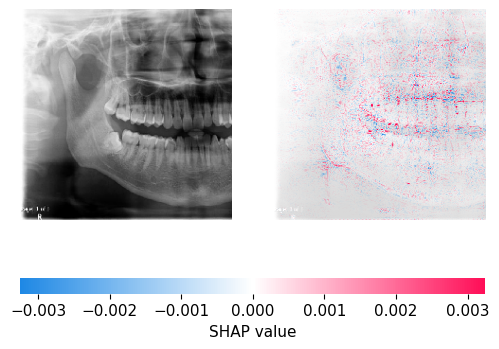

In [211]:
shap.image_plot(shap_values_E15_23Y_M, background_test_array[[654]])

plot_bboxes_on_image_pos(image_path, img_nms, grayscale_thresholded_>95)

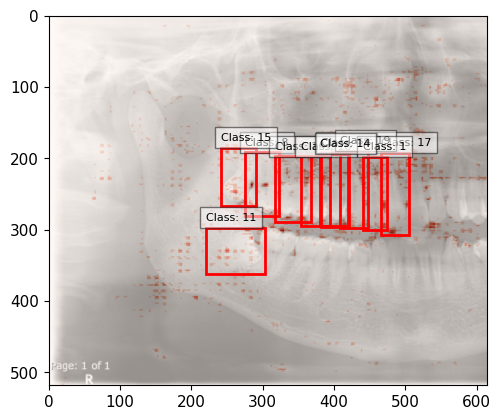

In [212]:
selected_bboxes_E15_23Y_M_pos = plot_bboxes_on_image_pos(Image_E15_23Y_M_path, df_E15_23Y_M_filtered_nms, grayscale_pos_thresholded)
%matplotlib inline

In [213]:
pd.DataFrame(selected_bboxes_E15_23Y_M_pos)

,0,1,2,3,4,5,6,7,8,9
0,"{'xmin': 275.2168055176735, 'ymin': 191.594207406044, 'xmax': 322.43833112716675, 'ymax': 280.94646692276, 'confidence': 0.922938883304596, 'class': 8, 'name': 'Upper Second Molar', 'iou': 1.0}","{'xmin': 219.84686517715454, 'ymin': 297.13856732845306, 'xmax': 303.4970391392708, 'ymax': 362.5264490842819, 'confidence': 0.9228953123092651, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 316.632067322731, 'ymin': 197.26876151561737, 'xmax': 367.8390153646469, 'ymax': 289.4352960586548, 'confidence': 0.9220705032348633, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 241.15792071819305, 'ymin': 184.88073348999023, 'xmax': 289.9973193407059, 'ymax': 266.07499170303345, 'confidence': 0.9186776280403137, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 466.1517502069473, 'ymin': 192.33078175783157, 'xmax': 504.72649800777435, 'ymax': 307.1000202894211, 'confidence': 0.8994160294532776, 'class': 17, 'name': 'Upper Central Incisor', 'iou': 1.0}","{'xmin': 353.24882555007935, 'ymin': 197.3167724609375, 'xmax': 393.993900179863, 'ymax': 294.4479783773422, 'confidence': 0.8983232975006104, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 381.928115606308, 'ymin': 191.5966774225235, 'xmax': 420.1567265987396, 'ymax': 296.00424313545227, 'confidence': 0.41477370262145996, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9091559646342046}","{'xmin': 408.52890133857727, 'ymin': 189.24707424640656, 'xmax': 447.3382741212845, 'ymax': 297.9089037179947, 'confidence': 0.8726596832275391, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 440.11576986312866, 'ymin': 197.37018656730652, 'xmax': 474.6912431716919, 'ymax': 300.2124719619751, 'confidence': 0.8652514815330505, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 380.778412938118, 'ymin': 193.91060429811478, 'xmax': 419.40904474258423, 'ymax': 295.18478429317474, 'confidence': 0.7993797659873962, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}"
1,0.15083,0.125,0.211842,0.20216,0.202624,0.242857,0.153727,0.211246,0.223776,0.156061


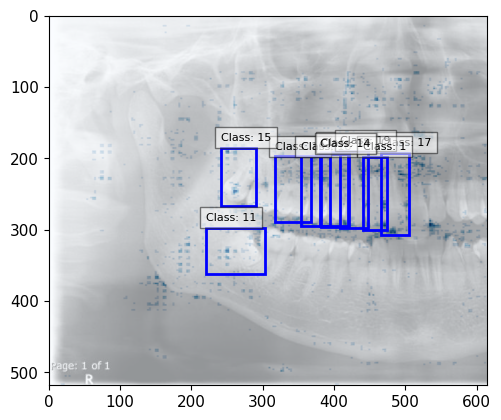

In [214]:
selected_bboxes_E15_23Y_M_neg = plot_bboxes_on_image_neg(Image_E15_23Y_M_path, df_E15_23Y_M_filtered_nms, grayscale_neg_thresholded)

In [215]:
pd.DataFrame(selected_bboxes_E15_23Y_M_neg)

,0,1,2,3,4,5,6,7,8
0,"{'xmin': 219.84686517715454, 'ymin': 297.13856732845306, 'xmax': 303.4970391392708, 'ymax': 362.5264490842819, 'confidence': 0.9228953123092651, 'class': 11, 'name': 'Lower Third Molar', 'iou': 1.0}","{'xmin': 316.632067322731, 'ymin': 197.26876151561737, 'xmax': 367.8390153646469, 'ymax': 289.4352960586548, 'confidence': 0.9220705032348633, 'class': 10, 'name': 'Upper First Molar', 'iou': 1.0}","{'xmin': 241.15792071819305, 'ymin': 184.88073348999023, 'xmax': 289.9973193407059, 'ymax': 266.07499170303345, 'confidence': 0.9186776280403137, 'class': 15, 'name': 'Upper Third Molar', 'iou': 1.0}","{'xmin': 466.1517502069473, 'ymin': 192.33078175783157, 'xmax': 504.72649800777435, 'ymax': 307.1000202894211, 'confidence': 0.8994160294532776, 'class': 17, 'name': 'Upper Central Incisor', 'iou': 1.0}","{'xmin': 353.24882555007935, 'ymin': 197.3167724609375, 'xmax': 393.993900179863, 'ymax': 294.4479783773422, 'confidence': 0.8983232975006104, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 1.0}","{'xmin': 381.928115606308, 'ymin': 191.5966774225235, 'xmax': 420.1567265987396, 'ymax': 296.00424313545227, 'confidence': 0.41477370262145996, 'class': 18, 'name': 'Upper Second Premolar', 'iou': 0.9091559646342046}","{'xmin': 408.52890133857727, 'ymin': 189.24707424640656, 'xmax': 447.3382741212845, 'ymax': 297.9089037179947, 'confidence': 0.8726596832275391, 'class': 19, 'name': 'Upper Canine', 'iou': 1.0}","{'xmin': 440.11576986312866, 'ymin': 197.37018656730652, 'xmax': 474.6912431716919, 'ymax': 300.2124719619751, 'confidence': 0.8652514815330505, 'class': 1, 'name': 'Upper Lateral Incisor', 'iou': 1.0}","{'xmin': 380.778412938118, 'ymin': 193.91060429811478, 'xmax': 419.40904474258423, 'ymax': 295.18478429317474, 'confidence': 0.7993797659873962, 'class': 14, 'name': 'Upper First Premolar', 'iou': 1.0}"
1,0.113095,0.143421,0.148148,0.221574,0.212698,0.173913,0.205167,0.232517,0.162121
